# Analytics - query to reference mapping  

This notebook is based on and adapted from this scvi-tools tutorial: https://docs.scvi-tools.org/en/stable/tutorials/notebooks/query_hlca_knn.html

In [1]:
import scvi
import mplscience
import matplotlib.pyplot as plt
import os
import pynndescent
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from scvi.data._download import _download
import anndata

scvi.settings.seed = 1

# plotting commands for the styling
mplscience.set_style(reset_current=True, name="default")

%load_ext autoreload
%autoreload 2

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 1


## Citations

scArches:  
Mohammad Lotfollahi, Mohsen Naghipourfar, Malte D. Luecken, Matin Khajavi, Maren Büttner, Marco Wagenstetter, Žiga Avsec, Adam Gayoso, Nir Yosef, Marta Interlandi, Sergei Rybakov, Alexander V. Misharin, and Fabian J. Theis. Mapping single-cell data to reference atlases by transfer learning. Nature Biotechnology, 40(1):121–130, August 2021. doi:10.1038/s41587-021-01001-7.  

scANVI:  
Chenling Xu, Romain Lopez, Edouard Mehlman, Jeffrey Regier, Michael I Jordan, and Nir Yosef. Probabilistic harmonization and annotation of single-cell transcriptomics data with deep generative models. Molecular Systems Biology, January 2021. doi:10.15252/msb.20209620.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

## 1️⃣ Download the pre-trained model

Here we use the HLCA dataset.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

Let's download the pre-trained model

In [2]:
local_dir = "/home/cane/Documents/yoseflab/can/scvi-hub"

In [4]:
model_url = "https://huggingface.co/scvi-tools/human-lung-cell-atlas/resolve/main/model.pt"
scvi.data._download._download(model_url, local_dir, "model.pt")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


## 2️⃣ Download the query data

For the query, we will use samples from the following publication:  

- Delorey, Toni M., et al. “COVID-19 tissue atlases reveal SARS-CoV-2 pathology and cellular targets.” Nature 595.7865 (2021): 107-113.

In [10]:
from scvi.data import cellxgene
adata_url = "https://cellxgene.cziscience.com/e/ae29ebd0-1973-40a4-a6af-d15a5f77a80f.cxg/"
query_data = cellxgene(adata_url, filename="pan_immune_cells.h5ad", save_path=local_dir)

In [11]:
query_data = query_data[query_data.obs['tissue'] == 'lung']

In [12]:
# add dataset information:
query_data.obs['dataset'] = "pan_immune_cell"

/tmp/ipykernel_401311/455780152.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  query_data.obs['dataset'] = "pan_immune_cell"


In [13]:
query_data

AnnData object with n_obs × n_vars = 8852 × 36503
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'cell_type_ontology_term_id_colors', 'default_embedding', 'schema_version', 'sex_ontology_term_id_colors', 'title'
    obsm: 'X_umap'

## 3️⃣ Build a query model

Use `prepare_query_anndata` to re-order the genes and pad any missing genes with 0s, so that query_adata matches exactly the reference in terms of its gene set.  

In [14]:
scvi.model.SCANVI.prepare_query_anndata(query_data, local_dir)

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               
INFO     Found 99.55000000000001% reference vars in query data.                                                    


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [15]:
query_data.obs["scanvi_label"] = "unlabeled"

In [16]:
query_model = scvi.model.SCANVI.load_query_data(query_data, local_dir, accelerator = "cpu")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [17]:
query_model.adata

AnnData object with n_obs × n_vars = 8852 × 2000
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_umap'

Train the query model.

In [18]:
surgery_epochs = 500
train_kwargs_surgery = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}

In [19]:
query_model.train(
    max_epochs=surgery_epochs,
    accelerator="gpu",
    **train_kwargs_surgery,
)

INFO     Training for 500 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 177/500:  35%|███▌      | 177/500 [01:06<02:00,  2.67it/s, v_num=1, train_loss_step=553, train_loss_epoch=550]
Monitored metric elbo_train did not improve in the last 10 records. Best score: 606.288. Signaling Trainer to stop.


In [2]:
query_save_path = f"{local_dir}/query_model_census"
query_model.save(query_save_path, overwrite=True)
query_data.write(f"{local_dir}/mf_fibrosis.h5ad")

NameError: name 'query_model' is not defined

In [11]:
query_save_path = f"{local_dir}/query_model_pan_immune"
query_data = sc.read(f"{local_dir}/pan_immune_atlas.h5ad")
query_model = scvi.model.SCANVI.load(query_save_path, adata=query_data)
query_data.obsm['X_scanvi_emb'] = query_model.get_latent_representation()

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/query_model_pan_immune/model.pt already downloaded        


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate

## 4️⃣ Learn a neighbors index on reference latent space  

Get the "latent space" from our embeddings for extended data set. It is essentially just the mean of the latent distribution.

In [5]:
from scvi.data import cellxgene

adata_url = "https://cellxgene.cziscience.com/e/9f222629-9e39-47d0-b83f-e08d610c7479.cxg/"
adata = cellxgene(adata_url, filename="adata_extended2.h5ad", save_path=local_dir)

In [6]:
adata

AnnData object with n_obs × n_vars = 2282447 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

In [7]:
ref = adata.obsm['X_scanvi_emb']
ref_nn_index = pynndescent.NNDescent(ref)
ref_nn_index.prepare()

## 5️⃣ Predict cell types

Let's predict using a different cell type than we did earlier, as that is too coarse grained (compartment-level resolution).

In [8]:
ref_neighbors, ref_distances = ref_nn_index.query(query_data.obsm['X_scanvi_emb'])

NameError: name 'query_data' is not defined

In [ ]:
def distances_to_affinities(distances):
    # convert distances to affinities
    stds = np.std(distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)
    distances_tilda = np.exp(-np.true_divide(distances, stds))
    weights = distances_tilda / np.sum(
        distances_tilda, axis=1, keepdims=True
    )
    return weights

# import numba
# @numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

weights = distances_to_affinities(ref_distances)

### Predict

In [ ]:
label_key = "ann_level_3"
ref_cats = adata.obs[label_key].cat.codes.to_numpy()[ref_neighbors]
p, u = weighted_prediction(weights, ref_cats)
p = np.asarray(adata.obs[label_key].cat.categories)[p]
query_data.obs["celltype_pred"], query_data.obs["celltype_uncertainty"] = p, u

### Evaluate predictions

Finally, let's evaluate predictions.

In [ ]:
query_data.obs[["celltype_pred", "celltype_uncertainty"]]

,celltype_pred,celltype_uncertainty
Pan_T7935492_AAACCTGAGGCTACGA,Unknown,5.000154e-01
Pan_T7935492_AAACCTGTCGGTTAAC,Innate lymphoid cell NK,9.999901e-02
Pan_T7935492_AAACGGGAGGTGTTAA,T cell lineage,0.000000e+00
Pan_T7935492_AAACGGGGTCCGACGT,T cell lineage,0.000000e+00
Pan_T7935492_AAAGATGAGTGTCCAT,Innate lymphoid cell NK,5.960464e-08
...,...,...
CZINY-0112_TTCGGTCCATCGAGCC,T cell lineage,5.960464e-08
CZINY-0112_TTGAACGCATACCAGT,Innate lymphoid cell NK,3.000016e-01
CZINY-0112_TTGCGTCAGCCTGGAA,T cell lineage,9.999990e-02
CZINY-0112_TTGTTCACAGTAACAA,Innate lymphoid cell NK,3.000005e-01


0.04174173267796413 5.960464477539063e-08


<Axes: ylabel='Density'>

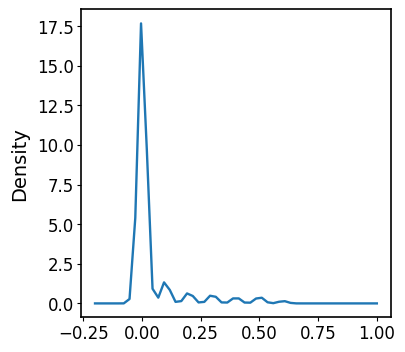

In [ ]:
print(query_data.obs["celltype_uncertainty"].mean(), np.quantile(query_data.obs["celltype_uncertainty"], 0.75))
query_data.obs["celltype_uncertainty"].plot(kind='density', ind=np.linspace(-0.2, 1))

In [ ]:
def get_comparison_df(uncertainty_threshold = None):
    # build comparison_df
    comparison_df = pd.DataFrame(index=query_data.obs_names, columns=["pred", "ground_truth", "pred_uncertainty"])
    comparison_df["pred"] = query_data.obs["celltype_pred"]
    comparison_df["pred_uncertainty"] = query_data.obs["celltype_uncertainty"]
    comparison_df["ground_truth"] = query_data.obs["Manually_curated_celltype"].fillna("Unknown")

    # we dont care about cases where we dont know the ground truth (in fact we could have skipped prediction for these altogether)
    n_before = len(comparison_df)
    comparison_df = comparison_df[comparison_df["ground_truth"] != "Unknown"]
    n_filtered = n_before-len(comparison_df)
    pct_filtered = 100*n_filtered/n_before
    print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with unknown ground truth")

    if uncertainty_threshold is not None:
        # filter out uncertainty > threshold
        n_before = len(comparison_df)
        comparison_df = comparison_df[comparison_df["pred_uncertainty"] <= uncertainty_threshold]
        n_filtered = n_before-len(comparison_df)
        pct_filtered = 100*n_filtered/n_before
        print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with pred uncertainty < {uncertainty_threshold}")

    return comparison_df

In [ ]:
comparison_df = get_comparison_df(uncertainty_threshold=0.2)

filtered out 0 barcodes (0.00%) with unknown ground truth
filtered out 740 barcodes (8.36%) with pred uncertainty < 0.2


## 6️⃣ Plot
Let's plot heatmap

In [ ]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/query_ref/"

In [ ]:
comparison_df["pred"].value_counts()

T cell lineage             5472
Innate lymphoid cell NK    2634
Multiciliated lineage         3
Unknown                       2
Mast cells                    1
Name: pred, dtype: int64

In [ ]:
comparison_df.groupby("pred")["pred_uncertainty"].mean()

pred
Innate lymphoid cell NK    0.025322
Mast cells                 0.099994
Multiciliated lineage      0.000000
T cell lineage             0.004240
Unknown                    0.150005
Name: pred_uncertainty, dtype: float64

In [ ]:
comparison_df = comparison_df.loc[comparison_df["pred"].isin(["T cell lineage", "Innate lymphoid cell NK"])]
comparison_df["pred"].value_counts()

T cell lineage             5472
Innate lymphoid cell NK    2634
Name: pred, dtype: int64

Some notes on the new HLCA annotations (https://zenodo.org/record/6337966/ vs https://zenodo.org/record/7599104):
- All new 60 cells have None for ann_level_3 annotations.
- No cells was predicted as "Smooth muscle FAM83D+" (even before thresholding on prediction uncertainty)
- In prev ann_level_3, not in new: 'Fibromyocytes'
- In new ann_level_3, not in prev: 'Smooth muscle FAM83D+'
- Only 565 cells differ between prev and new ann_level_3 annotations and their distribution is (prev, new):  
Fibromyocytes,Smooth muscle FAM83D+   -> 335  
Secretory,AT2                       ->   230

In [ ]:
# https://docs.scvi-tools.org/en/stable/tutorials/notebooks/cellassign_tutorial.html#Model-reproducibility
confusion_matrix = pd.crosstab(
    comparison_df["pred"],
    comparison_df["ground_truth"], 
    rownames=["Predicted label"],
    colnames=["True label"],
)
confusion_matrix /= confusion_matrix.sum(1).ravel().reshape(-1, 1)
confusion_matrix *= 100

<Axes: xlabel='True label', ylabel='Predicted label'>

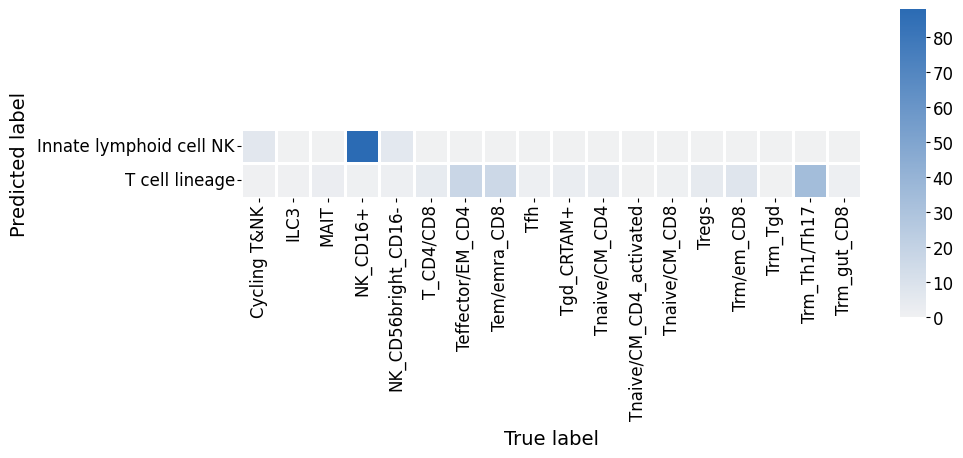

In [ ]:
from matplotlib.colors import LogNorm, Normalize

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(
    confusion_matrix,
    # cmap=sns.diverging_palette(245, 320, s=60, as_cmap=True),
    cmap=sns.color_palette("light:#2b6bb4", as_cmap=True),
    ax=ax,
    square=True,
    fmt=".2f",
    cbar_kws=dict(shrink=0.4, aspect=12),
    linecolor='white',
    linewidths=1, 
    # annot=True,
    # norm=LogNorm()
)

## 7️⃣ Visualize embeddings in the joint latent space

Combine embeddings

In [ ]:
query_data.obs["dataset"] = "pan_immune"
query_data

AnnData object with n_obs × n_vars = 8852 × 2000
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels', 'celltype_pred', 'celltype_uncertainty'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_manager_uuid', '_scvi_uuid'
    obsm: 'X_umap', 'X_scanvi_emb'

In [ ]:
adata

AnnData object with n_obs × n_vars = 2282447 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

In [ ]:
combined_data = adata.concatenate(query_data)

/tmp/ipykernel_414824/303776516.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_data = adata.concatenate(query_data)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


# Visualize embeddings

Visualize embeddings.

I do this on a device with more ram, but you can run it locally if you have enough ram.

In [ ]:
combined_data.var['feature_is_filtered-1'] = combined_data.var['feature_is_filtered-1'].astype("category")

In [ ]:
combined_data.write_h5ad(f"{local_dir}/combined_data_extended.h5ad")

In [ ]:
sc.pp.neighbors(combined_data, use_rep="X_scanvi_emb", method='rapids')
sc.tl.umap(combined_data, min_dist=0.3, method='rapids')
combined_data.write_h5ad(f"{local_dir}/combined_data_extended.h5ad")

#combined_emb_umap = anndata.read_h5ad(f"{local_dir}/combined_emb_umap.h5ad")

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 1) with CUDA driver version (12, 0) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 0) to continue using cuDF.
  warnings.warn(


In [35]:
import scanpy as sc
import anndata
combined_data = sc.read_h5ad(f"{local_dir}/combined_data_extended.h5ad")

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


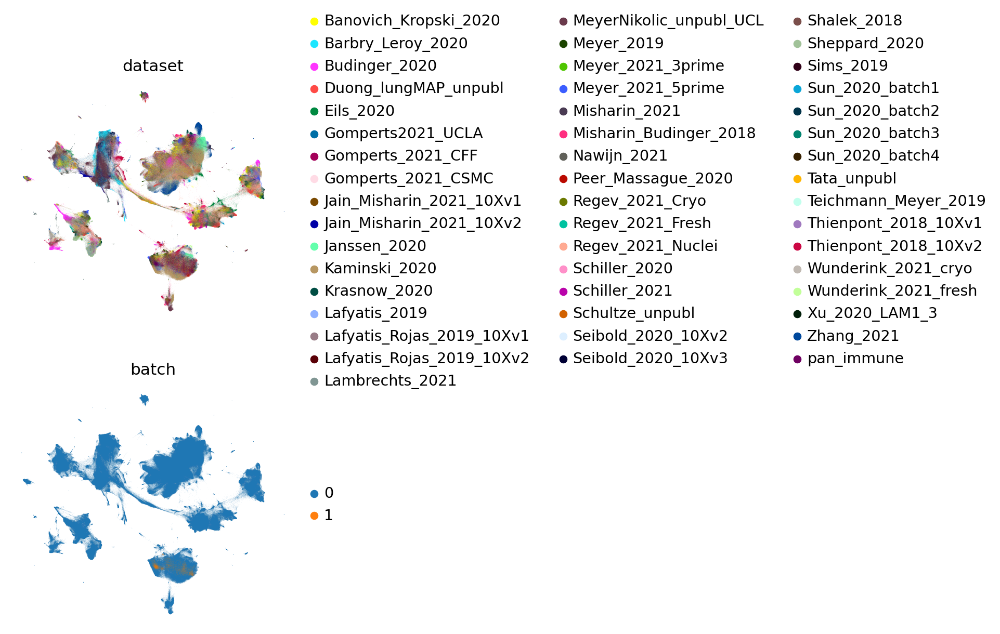

In [36]:
sc.pl.umap(
    combined_data,
    color=["dataset", "batch"],
    ncols=1,
    frameon=False,
)

Let's plot only batch. It is 1:1 equivalent with the dataset anyway as can be seen below.

In [37]:
idx1 = combined_data.obs["batch"] == "1"
idx2 = combined_data.obs["dataset"] == "pan_immune"
assert idx1.equals(idx2)

In [38]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [39]:
df = combined_data.obs
default_size = 120000 / len(df) # default scanpy
df["umap_size"] = default_size * 10
df.loc[df["batch"] == "1", "umap_size"] = default_size * 10 # if you want to make the query dataset points bigger
combined_data.obs = df

In [40]:
combined_data.var_names = combined_data.var['feature_name-0']

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:947: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['A1BG', 'A2M', 'ABCA1', 'ABCA3', 'ABCA6']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


In [41]:
pd.options.display.max_rows = 1000

In [42]:
combined_data.obs.iloc[0]

suspension_type                                                                          cell
donor_id                                    homosapiens_None_2023_None_sikkemalisa_002_d10...
is_primary_data                                                                         False
assay_ontology_term_id                                                            EFO:0009899
cell_type_ontology_term_id                                                         CL:0000583
development_stage_ontology_term_id                                             HsapDv:0000149
disease_ontology_term_id                                                         PATO:0000461
self_reported_ethnicity_ontology_term_id                                       HANCESTRO:0008
tissue_ontology_term_id                                                        UBERON:0008946
organism_ontology_term_id                                                      NCBITaxon:9606
sex_ontology_term_id                                        

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


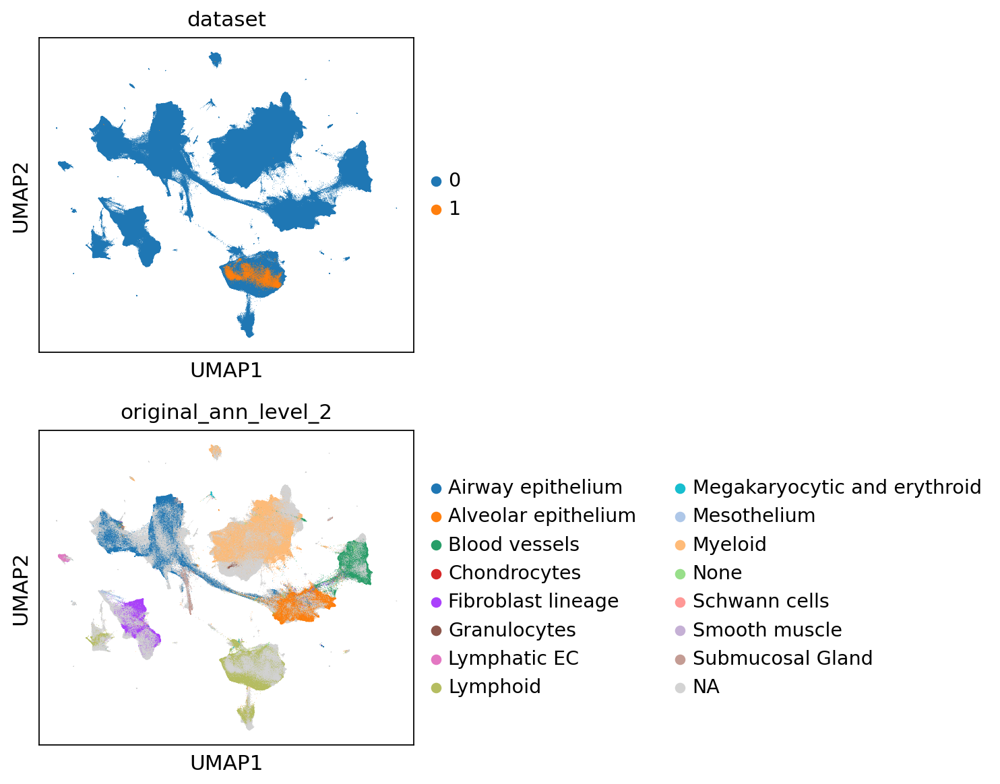

In [43]:
sc.pl.umap(
    combined_data,
    color=["batch", "original_ann_level_2"],
    ncols=1,
    frameon=True,
    save="combined_umap_batch_panimmune.svg",
    size=combined_data.obs["umap_size"],
    title="dataset",
    sort_order=False,
)

In [44]:
combined_data.obs['Manually_curated_celltype'].value_counts()

NK_CD16+                   2771
Trm_Th1/Th17               1876
Teffector/EM_CD4            947
Tem/emra_CD8                945
NK_CD56bright_CD16-         462
Trm/em_CD8                  417
Tregs                       256
T_CD4/CD8                   248
Cycling T&NK                216
Tnaive/CM_CD4               176
Tgd_CRTAM+                  148
MAIT                        124
Trm_gut_CD8                  82
Tfh                          79
ILC3                         40
Tnaive/CM_CD8                39
Trm_Tgd                      17
Tnaive/CM_CD4_activated       9
Name: Manually_curated_celltype, dtype: int64

In [45]:
pd.options.display.max_rows = 1000

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


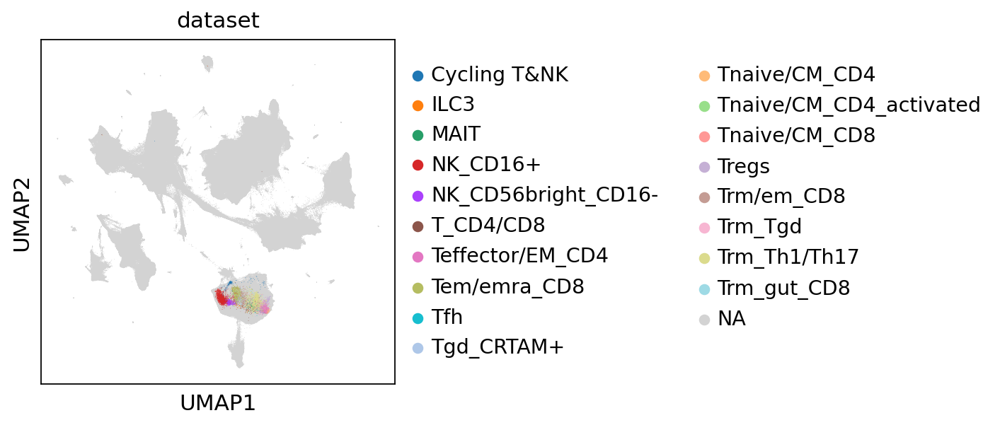

In [46]:
sc.pl.umap(
    combined_data,
    color=["Manually_curated_celltype"],
    ncols=1,
    frameon=True,
    save="combined_umap_celltype_panimmune.svg",
    size=combined_data.obs["umap_size"],
    title="dataset"
)

In [47]:
query_data = combined_data[combined_data.obs['batch'] == '1'].copy()
query = query_data.obsm['X_scanvi_emb']
query_nn_index = pynndescent.NNDescent(query)
query_nn_index.prepare()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


## 5️⃣ Predict cell types

Let's predict using a different cell type than we did earlier, as that is too coarse grained (compartment-level resolution).

In [48]:
combined_neighbors, combined_distances = query_nn_index.query(combined_data.obsm['X_scanvi_emb'])

In [49]:
def distances_to_affinities(distances):
    # convert distances to affinities
    stds = np.std(distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)
    distances_tilda = np.exp(-np.true_divide(distances, stds))
    weights = distances_tilda / np.sum(
        distances_tilda, axis=1, keepdims=True
    )
    return weights

# import numba
# @numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

weights = distances_to_affinities(combined_distances)

### Predict

In [50]:
query_data = combined_data[combined_data.obs['batch'] == '1'].copy()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [51]:
label_key = "Manually_curated_celltype"
query_cats = query_data.obs[label_key].cat.codes.to_numpy()[combined_neighbors]
p, u = weighted_prediction(weights, query_cats)
p = np.asarray(query_data.obs[label_key].cat.categories)[p]
combined_data.obs["celltype_pred"], combined_data.obs["celltype_uncertainty"] = p, u

0.37796249844772095 0.5998799502849579


<Axes: ylabel='Density'>

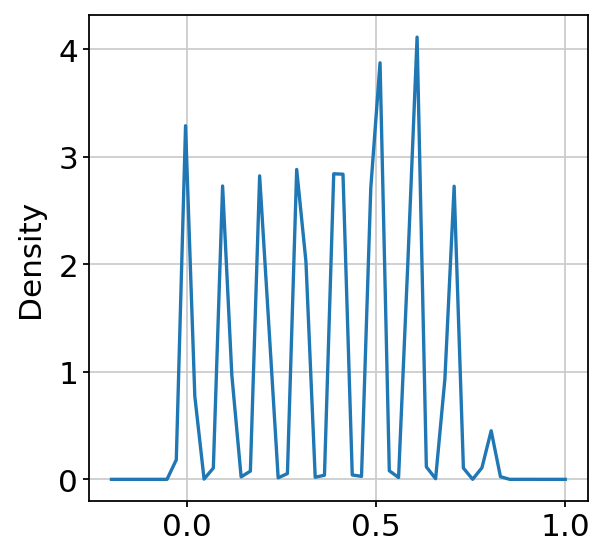

In [52]:
print(combined_data.obs["celltype_uncertainty"].mean(), np.quantile(combined_data.obs["celltype_uncertainty"], 0.75))
combined_data.obs["celltype_uncertainty"].plot(kind='density', ind=np.linspace(-0.2, 1))

In [3]:
import scanpy as sc
import anndata
combined_data = sc.read_h5ad(f"{local_dir}/combined_data_extended_annotated.h5ad")

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [4]:
combined_data

AnnData object with n_obs × n_vars = 2291299 × 1937
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', '

In [55]:
combined_data.obs.head()

,suspension_type,donor_id,is_primary_data,assay_ontology_term_id,cell_type_ontology_term_id,development_stage_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,tissue_ontology_term_id,organism_ontology_term_id,...,development_stage,Predicted_labels_CellTypist,Majority_voting_CellTypist,Manually_curated_celltype,_scvi_batch,_scvi_labels,celltype_pred,celltype_uncertainty,batch,umap_size
CGATGTAAGTTACGGG_SC10-0,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,False,EFO:0009899,CL:0000583,HsapDv:0000149,PATO:0000461,HANCESTRO:0008,UBERON:0008946,NCBITaxon:9606,...,55-year-old human stage,NaN,NaN,NaN,NaN,NaN,T_CD4/CD8,0.600014,0,0.52372
cc05p_CATGCCTGTGTGCCTG_carraro_csmc-0,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0009899,CL:0000003,unknown,PATO:0000461,unknown,UBERON:0002048,NCBITaxon:9606,...,unknown,NaN,NaN,NaN,NaN,NaN,NK_CD16+,0.499994,0,0.52372
ATTCTACCAAGGTTCT_HD68-0,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,False,EFO:0011025,CL:0002144,HsapDv:0000135,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,41-year-old human stage,NaN,NaN,NaN,NaN,NaN,NK_CD16+,0.300002,0,0.52372
D062_TGACCCTTCAAACCCA-sub_wang_sub_batch3-0,nucleus,homosapiens_None_2023_None_sikkemalisa_002_d10...,False,EFO:0009922,CL:4028004,HsapDv:0000082,PATO:0000461,unknown,UBERON:0002048,NCBITaxon:9606,...,newborn human stage,NaN,NaN,NaN,NaN,NaN,Tem/emra_CD8,0.699904,0,0.52372
muc9826_GTCGTGAGAGGA_mayr-0,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0008722,CL:0002145,HsapDv:0000151,MONDO:0002771,unknown,UBERON:0002048,NCBITaxon:9606,...,57-year-old human stage,NaN,NaN,NaN,NaN,NaN,T_CD4/CD8,0.599921,0,0.52372


In [62]:
combined_data.obs['celltype_certainty'] = 1 - combined_data.obs['celltype_uncertainty']

In [81]:
df = combined_data.obs
default_size = 12000 / len(df) # default scanpy
df["umap_size"] = default_size * 10
df.loc[df["batch"] == "1", "umap_size"] = default_size * 30 # if you want to make the query dataset points bigger
combined_data.obs = df

In [84]:
combined_data[combined_data.obs['batch'] == '1']

View of AnnData object with n_obs × n_vars = 8852 × 1937
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonize

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


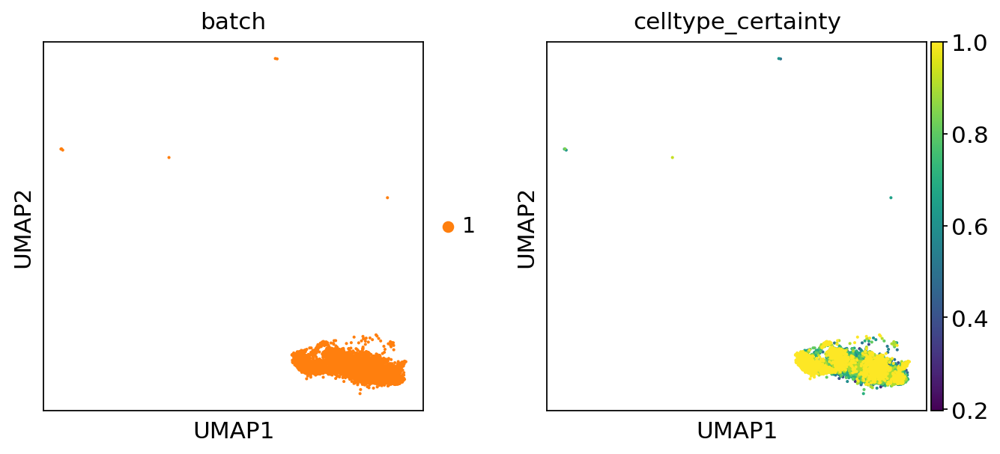

In [85]:
sc.pl.umap(
    combined_data[combined_data.obs['batch'] == '1'],
    color=["batch", "celltype_certainty"],
    #title="dataset"
)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


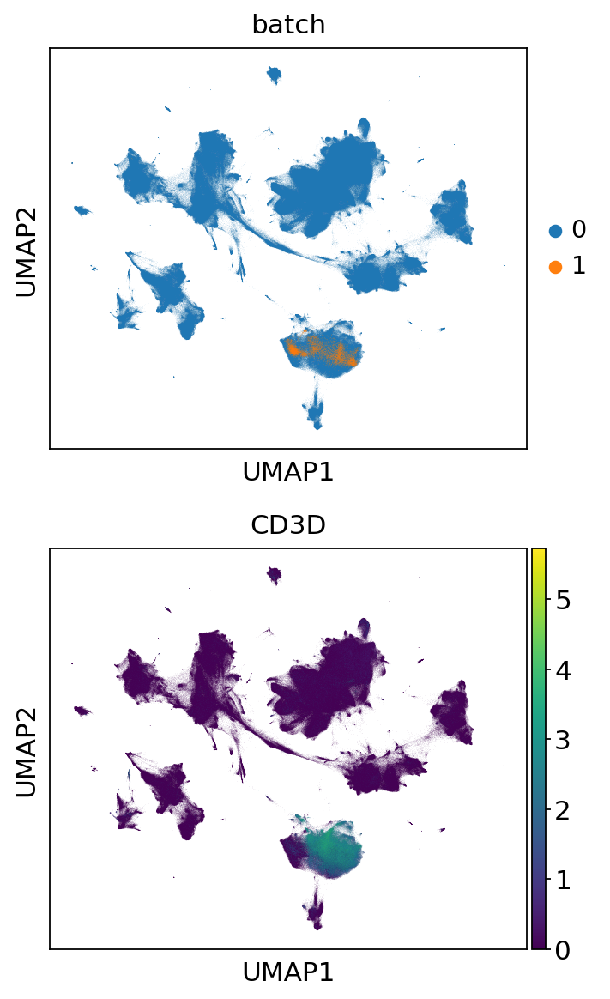

: 

In [88]:
sc.pl.umap(
    combined_data,
    color=["batch", "CD3D"],
    ncols=1,
    sort_order=True,
    frameon=True,
    save="combined_umap_certainty_panimmune.svg",
    size=combined_data.obs["umap_size"],
    #title="dataset"
)

In [ ]:
pd.options.display.max_rows = 1000

In [81]:
query_combined = combined_data[combined_data.obs['batch'] == '1'].copy()
ref_combined = combined_data[np.logical_and(combined_data.obs['ann_level_3'].isin(['T cell lineage', 'Innate lymphoid cell NK']), combined_data.obs['batch']=='0')]

In [125]:
ref_combined.obs['ann_finest_level'].value_counts()

CD8 T cells              113641
CD4 T cells               82698
NK cells                  48439
Unknown                   45358
T cells proliferating      3908
Name: ann_finest_level, dtype: int64

In [102]:
def get_comparison_df(adata, uncertainty_threshold = None, ground_truth="Manually_curated_celltype"):
    # build comparison_df
    comparison_df = pd.DataFrame(index=adata.obs_names, columns=["pred", "ground_truth", "pred_uncertainty"])
    comparison_df["pred"] = adata.obs["celltype_pred"]
    comparison_df["pred_uncertainty"] = adata.obs["celltype_uncertainty"]
    print()
    #adata.obs[ground_truth].cat.add_categories("Unknown", inplace=True)
    comparison_df["ground_truth"] = adata.obs[ground_truth].fillna("Unknown")
    print(adata.obs["celltype_uncertainty"].mean())
    print(comparison_df["pred_uncertainty"].mean())

    # we dont care about cases where we dont know the ground truth (in fact we could have skipped prediction for these altogether)
    n_before = len(comparison_df)
    comparison_df = comparison_df[comparison_df["ground_truth"] != "Unknown"]
    n_filtered = n_before-len(comparison_df)
    pct_filtered = 100*n_filtered/n_before
    print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with unknown ground truth")
    print('3', comparison_df["pred_uncertainty"].mean())

    if uncertainty_threshold is not None:
        # filter out uncertainty > threshold
        n_before = len(comparison_df)
        comparison_df = comparison_df[comparison_df["pred_uncertainty"] <= uncertainty_threshold]
        n_filtered = n_before-len(comparison_df)
        print('4', comparison_df["pred_uncertainty"].mean())
        pct_filtered = 100*n_filtered/n_before
        print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with pred uncertainty < {uncertainty_threshold}")
    print('4', comparison_df["pred_uncertainty"].mean())
    return comparison_df

In [97]:
comparison_df = get_comparison_df(query_combined, uncertainty_threshold=0.2)

0.14918788605471892
0.14918788605471892
filtered out 0 barcodes (0.00%) with unknown ground truth
filtered out 2548 barcodes (28.78%) with pred uncertainty < 0.2


In [104]:
comparison_df_ref = get_comparison_df(ref_combined, uncertainty_threshold=0.2, ground_truth="ann_finest_level")


0.26764219676974466
0.26764219676974466
filtered out 45358 barcodes (15.43%) with unknown ground truth
3 0.25117301689806987
4 0.05465687580954912
filtered out 129571 barcodes (52.10%) with pred uncertainty < 0.2
4 0.05465687580954912


In [105]:
comparison_df_ref

,pred,ground_truth,pred_uncertainty
TACTCGCGTGTGGTTT-1-HCATisStab7747197-0,Tem/emra_CD8,CD8 T cells,0.000000e+00
193CO-b_TTTGTCATCTGCCAGG_adams-0,NK_CD16+,NK cells,9.999692e-02
P2_7_GATTCAGTCTCCAGGG-0,NK_CD16+,NK cells,5.960464e-08
TTGAACGTCCAGAGGA-WSSS8062679-0_meyer_unpubl-0,NK_CD56bright_CD16-,CD8 T cells,0.000000e+00
AGCGGTCAGAATCTCC-WSSS8123930-0_meyer_unpubl-0,Trm_Th1/Th17,CD4 T cells,9.999490e-02
...,...,...,...
scrBT1428_GACTACACAGATTGCT_lambrechts-0,Trm_Th1/Th17,CD8 T cells,1.000013e-01
P3_5_ATCATGGAGCTTCGCG-0,NK_CD16+,NK cells,0.000000e+00
TAAGTGCCATGTTCCC-18_grant_cryo-0,Cycling T&NK,T cells proliferating,0.000000e+00
3782_laughney-0,Teffector/EM_CD4,CD4 T cells,1.000023e-01


In [106]:
comparison_df_ref.groupby("ground_truth")["pred_uncertainty"].mean()

ground_truth
CD4 T cells              0.080733
CD8 T cells              0.085486
NK cells                 0.012711
T cells proliferating    0.024538
Unknown                       NaN
Name: pred_uncertainty, dtype: float64

Some notes on the new HLCA annotations (https://zenodo.org/record/6337966/ vs https://zenodo.org/record/7599104):
- All new 60 cells have None for ann_level_3 annotations.
- No cells was predicted as "Smooth muscle FAM83D+" (even before thresholding on prediction uncertainty)
- In prev ann_level_3, not in new: 'Fibromyocytes'
- In new ann_level_3, not in prev: 'Smooth muscle FAM83D+'
- Only 565 cells differ between prev and new ann_level_3 annotations and their distribution is (prev, new):  
Fibromyocytes,Smooth muscle FAM83D+   -> 335  
Secretory,AT2                       ->   230

In [172]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def _prediction_eval(
    pred,
    labels,
    name,
    x_label="",
    y_label="",
    save_fig=None,
):
    """Generate confusion matrix."""
    types, _ = np.unique(np.concatenate([labels, pred]), return_inverse=True)
    mtx = confusion_matrix(labels, pred, normalize="true")
    df = pd.DataFrame(mtx, columns=types, index=types)
    df = df.loc[np.unique(labels), np.unique(pred)]
    df = df.rename_axis(x_label, axis="columns")
    df = df.rename_axis(y_label)
    df = df[df.idxmax(axis=1).unique()]
    print(pred.value_counts().index[pred.value_counts()>1], labels.value_counts().index[labels.value_counts()>1])
    df = df[pred.value_counts().index[pred.value_counts()>1]]
    df = df.loc[labels.value_counts().index[labels.value_counts()>1]]
    positions = [df.columns.get_loc(index) for index in df.idxmax(axis=1)]
    df = df.loc[df.index[np.argsort(positions)]]
    fig, ax = plt.subplots(figsize=[15, 15])
    sns.heatmap(df.T, linewidths=0.005, cmap="OrRd", square=True)
    plt.tight_layout()
    plt.title(name)
    plt.xlabel('PopV prediction')
    plt.ylabel('Original Annotation')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

    if save_fig:
        plt.savefig(save_fig)
    plt.show()
    
    return df

In [108]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['svg.fonttype'] = 'none'

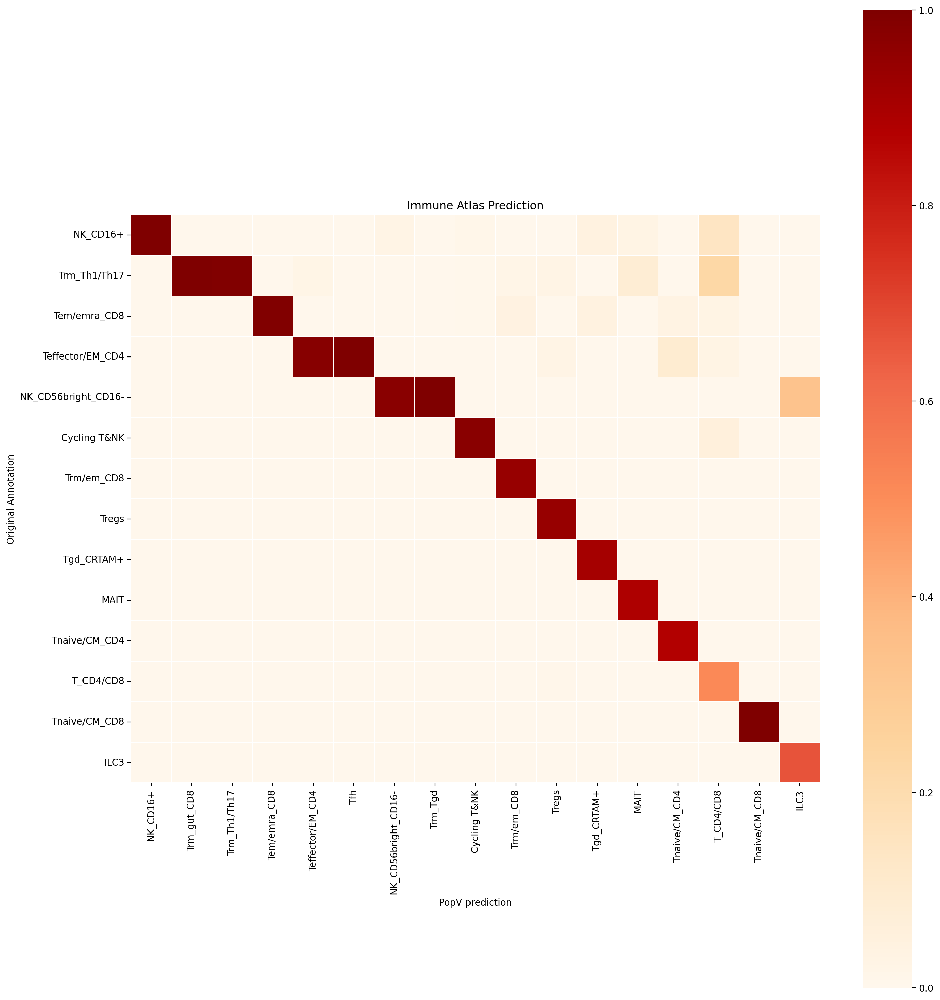

In [112]:
plt.style.use('default')

_ = _prediction_eval(
    pred=comparison_df["pred"],
    labels=comparison_df["ground_truth"],
    name='Immune Atlas Prediction',
    x_label=["Predicted label"],
    y_label=["True label"],
    save_fig=f"immune_atlas_celltype_prediction.pdf",
)

In [160]:
dfc

Predicted label,T cells proliferating,CD8 T cells,CD4 T cells,NK cells
True label,,,,
Cycling T&NK,0.842491,0.004121,0.001374,0.152015
ILC3,0.000000,0.666667,0.333333,0.000000
MAIT,0.000000,0.109635,0.890365,0.000000
NK_CD16+,0.000000,0.034987,0.000044,0.964969
NK_CD56bright_CD16-,0.000000,0.433601,0.001235,0.565164
T_CD4/CD8,0.000000,0.108046,0.891954,0.000000
Teffector/EM_CD4,0.000000,0.002840,0.997160,0.000000
Tem/emra_CD8,0.000000,0.994676,0.001212,0.004112
Tgd_CRTAM+,0.000000,1.000000,0.000000,0.000000


In [170]:
plt.style.fonttype = None
mpl.rc('pdf', fonttype=42)

CategoricalIndex(['NK cells', 'CD8 T cells', 'CD4 T cells',
                  'T cells proliferating'],
                 categories=['CD4 T cells', 'CD8 T cells', 'NK cells', 'T cells proliferating', 'Unknown'], ordered=False, dtype='category') CategoricalIndex(['NK_CD16+', 'Trm_Th1/Th17', 'Tem/emra_CD8',
                  'Teffector/EM_CD4', 'Tregs', 'Cycling T&NK', 'Trm/em_CD8',
                  'NK_CD56bright_CD16-', 'T_CD4/CD8', 'MAIT', 'Tgd_CRTAM+',
                  'Tnaive/CM_CD4', 'Tnaive/CM_CD8', 'ILC3', 'Trm_gut_CD8'],
                 categories=['Cycling T&NK', 'ILC3', 'MAIT', 'NK_CD16+', ..., 'Trm/em_CD8', 'Trm_Tgd', 'Trm_Th1/Th17', 'Trm_gut_CD8'], ordered=False, dtype='category')


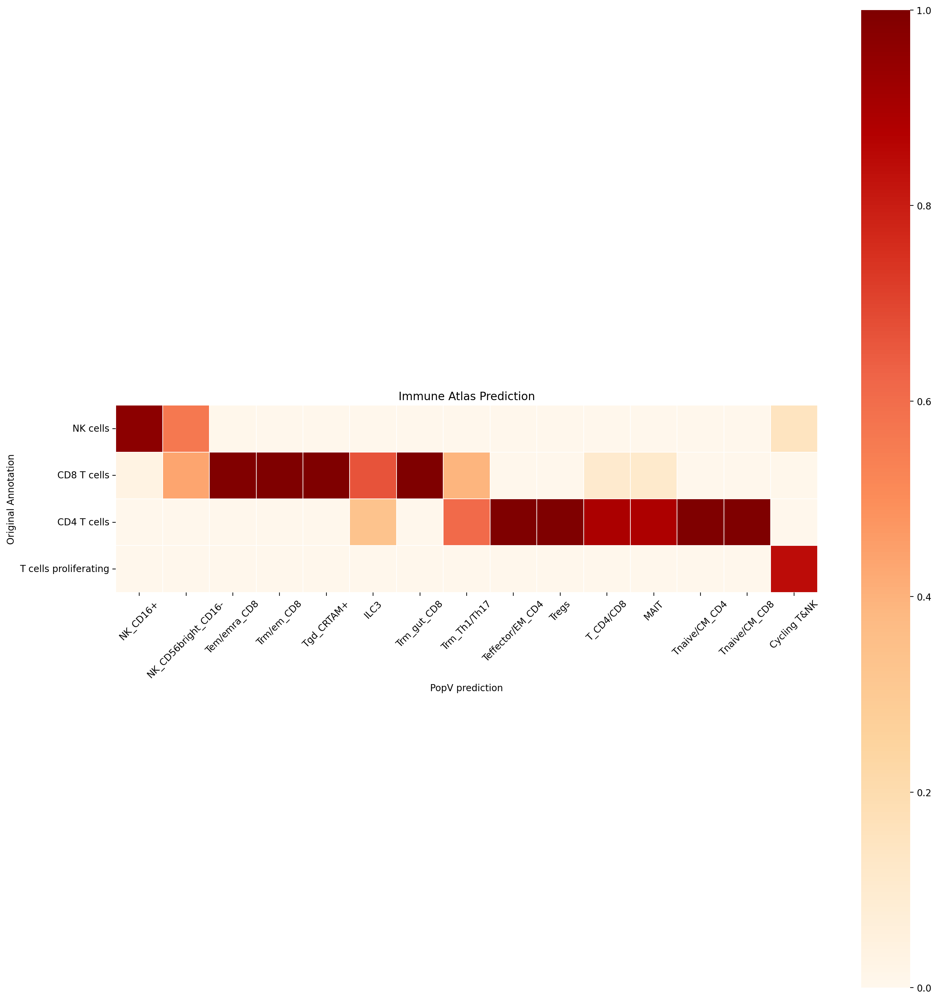

In [173]:
dfc = _prediction_eval(
    pred=comparison_df_ref["ground_truth"],
    labels=comparison_df_ref["pred"],
    name='Immune Atlas Prediction',
    x_label=["Predicted label"],
    y_label=["True label"],
    save_fig=f"immune_atlas_celltype_prediction_ref.pdf",
)

In [71]:
combined_data.obs['ann_level_3'].value_counts()

Macrophages                     524452
Unknown                         280408
T cell lineage                  245605
Secretory                       181002
AT2                             157476
Basal                           144420
Fibroblasts                     129222
Multiciliated lineage           124124
Monocytes                       107416
B cell lineage                   71270
EC capillary                     70759
Innate lymphoid cell NK          48439
Dendritic cells                  41291
EC venous                        37838
AT1                              32306
Mast cells                       21323
EC arterial                      14724
Lymphatic EC mature              11680
Submucosal Secretory             11001
None                              3286
Rare                              3039
Myofibroblasts                    1926
SM activated stress response      1788
Lymphatic EC differentiating      1359
Smooth muscle FAM83D+              553
Lymphatic EC proliferatin

In [174]:
ref_tcell = combined_data[np.logical_or(combined_data.obs['ann_level_3'].isin(['T cell lineage', 'Innate lymphoid cell NK']), combined_data.obs['batch']=='1')]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


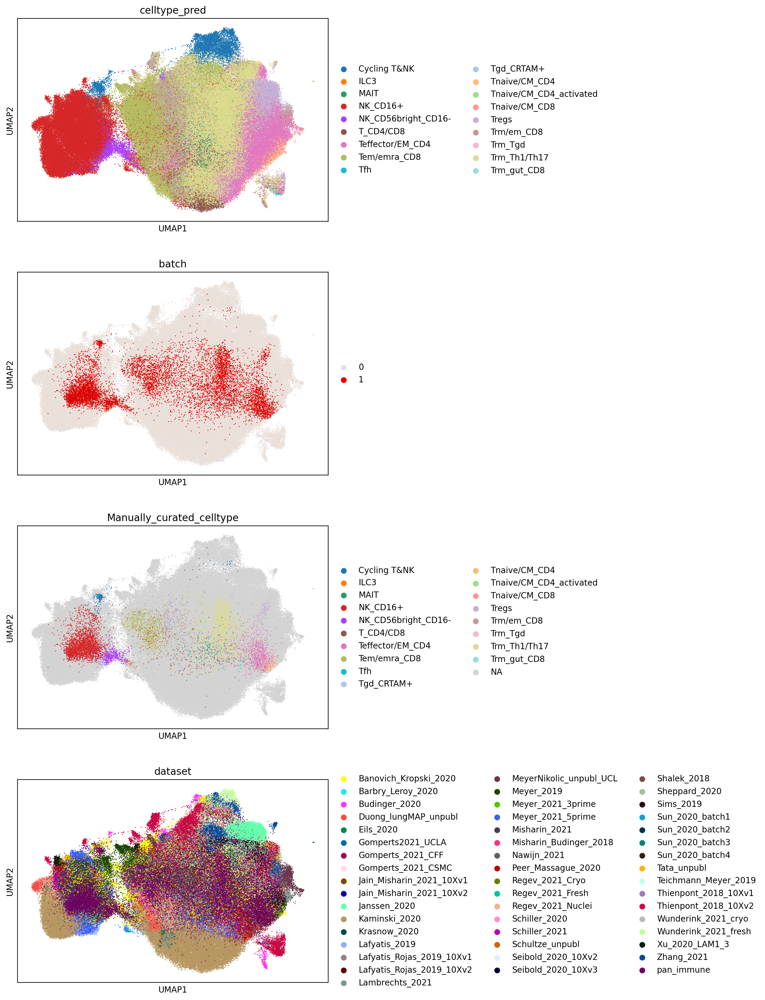

In [175]:
sc.pp.neighbors(ref_tcell, use_rep="X_scanvi_emb")
sc.tl.umap(ref_tcell)
sc.pl.umap(ref_tcell, color=['celltype_pred', 'batch', 'Manually_curated_celltype', 'dataset'], ncols=1, size=5, save='_predicted_tcells.pdf')

In [176]:
ref_tcell2 = ref_tcell.copy()
ref_tcell.var.index = ref_tcell.var['feature_name-0']

In [177]:
set(['PDCD1', 'CXCR5', 'IL21', 'BCL6', 'CD8A', 'GZMA', 'GZMB', 'GZMK', 'CCR7', 'KLRB1', 'KLRG1', 'MKI67', 'TYROBP']).intersection(ref_tcell.var.index)

{'CCR7',
 'CD8A',
 'CXCR5',
 'GZMA',
 'GZMB',
 'GZMK',
 'IL21',
 'KLRB1',
 'KLRG1',
 'MKI67',
 'PDCD1',
 'TYROBP'}

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


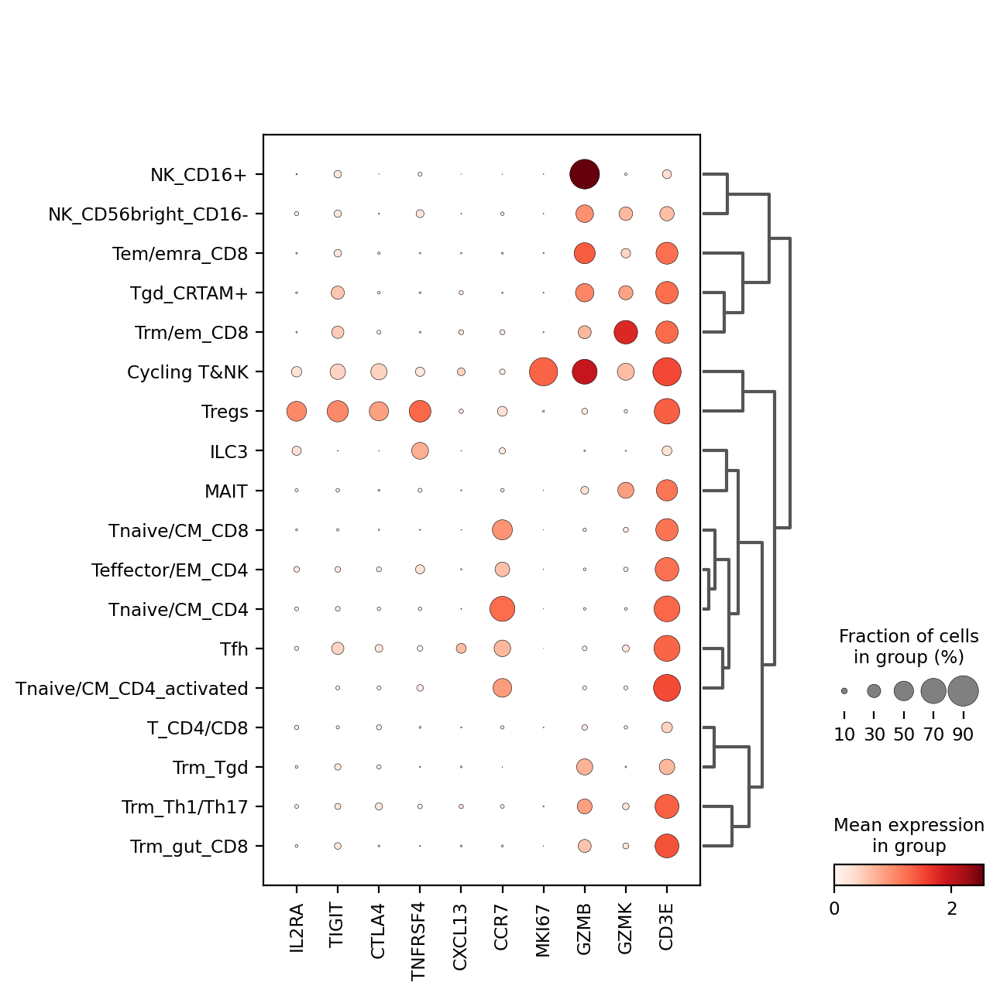

In [178]:
sc.pl.dotplot(ref_tcell, var_names=['IL2RA', 'TIGIT', 'CTLA4', 'TNFRSF4', 'CXCL13', 'CCR7', 'MKI67', 'GZMB', 'GZMK', 'CD3E'],
              groupby='celltype_pred', gene_symbols='feature_name-0', save='_predicted_treg_markers.pdf', use_raw=False, dendrogram=True)

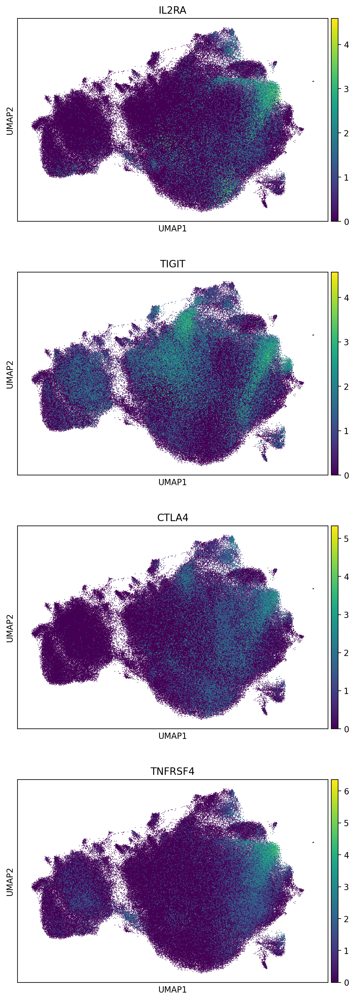

In [179]:
sc.pl.umap(ref_tcell, color=['IL2RA', 'TIGIT', 'CTLA4', 'TNFRSF4'], gene_symbols='feature_name-0', save='_predicted_treg_markers.pdf', size=3, ncols=1)

In [82]:
ref_tregs = combined_data[np.logical_and(combined_data.obs['ann_level_3'].isin(['T cell lineage', 'Innate lymphoid cell NK']), combined_data.obs['celltype_pred']=='Tem/emra_CD8')]

In [83]:
combined_data.obs['celltype_pred'].value_counts()

NK_CD16+                   628439
Tem/emra_CD8               513596
Trm_Th1/Th17               440091
T_CD4/CD8                  220072
Teffector/EM_CD4           170027
NK_CD56bright_CD16-         90769
Trm/em_CD8                  65680
Cycling T&NK                42113
ILC3                        40053
Tregs                       38675
Tgd_CRTAM+                  14777
MAIT                        14334
Tnaive/CM_CD4                5205
Tfh                          2623
Trm_gut_CD8                  2068
Tnaive/CM_CD8                1093
Trm_Tgd                       953
Tnaive/CM_CD4_activated       731
Name: celltype_pred, dtype: int64

In [ ]:
2

In [84]:
adata_url = "https://cellxgene.cziscience.com/e/066943a2-fdac-4b29-b348-40cede398e4e.cxg/"
b = cellxgene(adata_url, filename="adata_extended2.h5ad", save_path=local_dir)

: 

In [ ]:
raw_tregs = b[[i[:-2] for i in ref_tregs.obs_names]].copy()
raw_tregs.X = raw_tregs.raw.X

In [ ]:
raw_tregs.var_names = raw_tregs.var['feature_name'].astype(str)

In [ ]:
raw_tregs.obs['batch'] = raw_tregs.obs['donor_id'].astype(str) + raw_tregs.obs['dataset'].astype(str) + raw_tregs.obs['assay'].astype(str) + raw_tregs.obs['disease'].astype(str)

In [ ]:
import decoupler as dc

# Get pseudo-bulk profile
pdata = dc.get_pseudobulk(
    raw_tregs,
    sample_col='batch',
    groups_col=None,
    mode='sum',
    min_cells=10,
    min_counts=1000,
)
pdata

AnnData object with n_obs × n_vars = 307 × 37023
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'ann_level_1', 'ann_level_2', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'mixed_ancestry', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_dissociation_protocol', 'transf_ann_level_1_label', 'transf_ann_level_2_label', 'assay', 'disease', 'organism', 'sex', 'self_reported_ethnicity', 'development_stage', 'batch', 'psbulk_n_cells', 'psbulk_counts'
    var: 'feature_is_filtered', 'original_gene_symbols', 'feature_name', 'feature_reference', 'feature_biotype'
    layers: 'psbulk_props'

In [ ]:
pdata

AnnData object with n_obs × n_vars = 307 × 37023
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'ann_level_1', 'ann_level_2', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'mixed_ancestry', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_dissociation_protocol', 'transf_ann_level_1_label', 'transf_ann_level_2_label', 'assay', 'disease', 'organism', 'sex', 'self_reported_ethnicity', 'development_stage', 'batch', 'psbulk_n_cells', 'psbulk_counts'
    var: 'feature_is_filtered', 'original_gene_symbols', 'feature_name', 'feature_reference', 'feature_biotype'
    layers: 'psbulk_props'

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


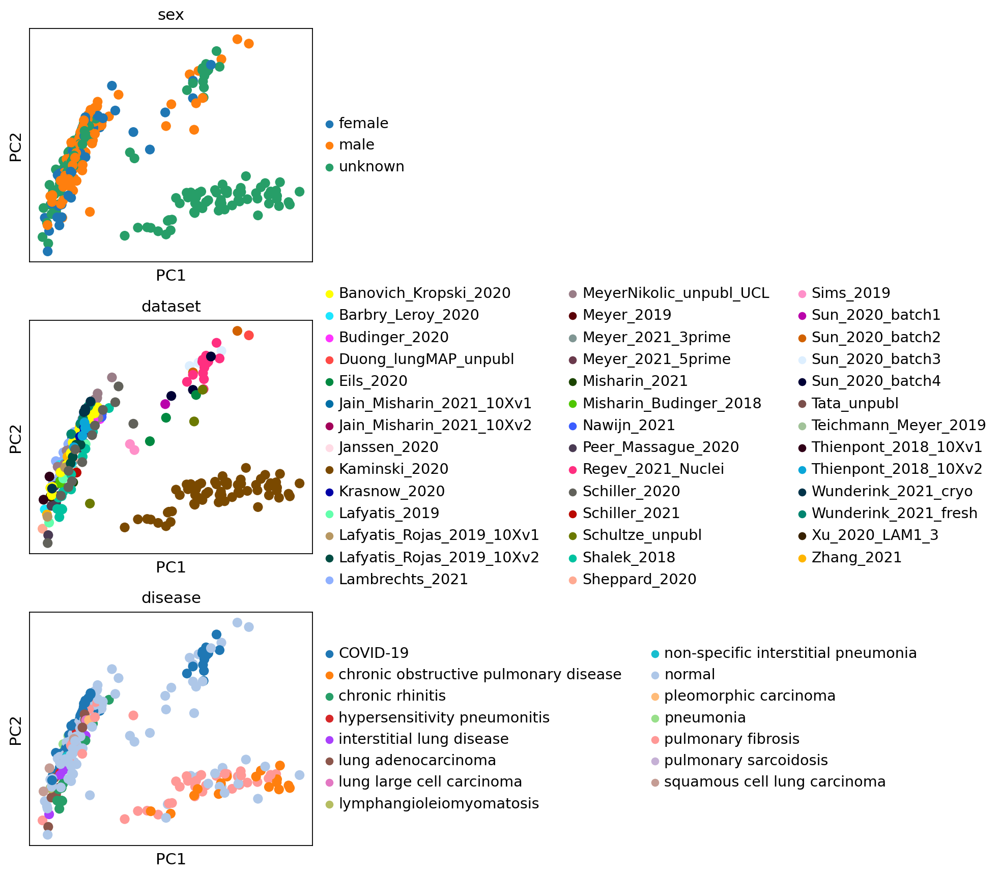

In [ ]:
pp_pdata = pdata.copy()
sc.pp.normalize_total(pp_pdata, target_sum=1e6)
sc.pp.log1p(pp_pdata)
sc.pp.scale(pp_pdata, max_value=10)
sc.tl.pca(pp_pdata, n_comps=10)
sc.pl.pca(pp_pdata, color=['sex', 'dataset', 'disease'], ncols=1, show=True, size=300)

In [ ]:
pdata.obs['disease'].value_counts()

normal                                   155
COVID-19                                  50
pulmonary fibrosis                        44
chronic obstructive pulmonary disease     16
lung adenocarcinoma                       11
chronic rhinitis                          10
pneumonia                                  5
interstitial lung disease                  5
squamous cell lung carcinoma               3
hypersensitivity pneumonitis               2
lymphangioleiomyomatosis                   2
pulmonary sarcoidosis                      1
non-specific interstitial pneumonia        1
lung large cell carcinoma                  1
pleomorphic carcinoma                      1
Name: disease, dtype: int64

In [ ]:
# Obtain genes that pass the thresholds

genes = dc.filter_by_expr(pdata, group='sex', min_count=2, min_total_count=15)

# Filter by these genes
pdatas = pdata[:, genes].copy()
pdatas, pdatas[:, 'XIST']

disease = 'COVID-19' #'pulmonary fibrosis'
pdatas = pdatas[pdata.obs['disease'].isin([disease, 'normal'])].copy()

In [ ]:
pdatas

AnnData object with n_obs × n_vars = 205 × 10017
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'ann_level_1', 'ann_level_2', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'mixed_ancestry', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_dissociation_protocol', 'transf_ann_level_1_label', 'transf_ann_level_2_label', 'assay', 'disease', 'organism', 'sex', 'self_reported_ethnicity', 'development_stage', 'batch', 'psbulk_n_cells', 'psbulk_counts'
    var: 'feature_is_filtered', 'original_gene_symbols', 'feature_name', 'feature_reference', 'feature_biotype'
    layers: 'psbulk_props'

In [ ]:
# Import DESeq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [ ]:
import decoupler as dc

# Get pseudo-bulk profile
pdata = dc.get_pseudobulk(
    raw_tregs,
    sample_col='batch',
    groups_col=None,
    mode='sum',
    min_cells=10,
    min_counts=1000,
)
pdata

# Obtain genes that pass the thresholds

genes = dc.filter_by_expr(pdata, group='sex', min_count=2, min_total_count=15)

# Filter by these genes
pdatas = pdata[:, genes].copy()

disease = 'COVID-19' #'pulmonary fibrosis'
pdatas = pdatas[pdata.obs['disease'].isin([disease, 'normal'])].copy()

# Build DESeq2 object
dds = DeseqDataSet(
    adata=pdatas,
    design_factors=['disease', 'sex', 'assay'], #, 'dataset', 
    refit_cooks=True,
    n_cpus=8,
)

# Compute LFCs
dds.deseq2()
stat_res = DeseqStats(dds, contrast=["disease", disease, 'normal'], n_cpus=8)

In [ ]:
# Compute Wald test
stat_res.summary()
# Extract results
results_df = stat_res.results_df
results_df

Log2 fold change & Wald test p-value: disease COVID-19 vs normal


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
feature_name,,,,,,
A1BG,4.974161,-0.606035,0.227543,-2.663385,7.735885e-03,0.040084
A2M,8.348769,-3.156780,0.603816,-5.228047,1.713096e-07,0.000008
A2M-AS1,2.248167,0.380905,0.457562,0.832466,4.051459e-01,0.584549
A2MP1,1.340328,-2.655935,1.376025,-1.930150,5.358821e-02,0.154147
AAAS,2.371162,-0.465844,0.158076,-2.946967,3.209077e-03,0.020994
...,...,...,...,...,...,...
ZWILCH,1.480450,0.367165,0.246179,1.491454,1.358424e-01,0.284823
ZXDC,4.383156,-0.124916,0.330758,-0.377667,7.056783e-01,0.827643
ZYG11B,2.267805,-0.489981,0.303030,-1.616942,1.058909e-01,0.242666


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
feature_name,,,,,,
A1BG,4.974161,-0.606035,0.227543,-2.663385,7.735885e-03,0.040084
A2M,8.348769,-3.156780,0.603816,-5.228047,1.713096e-07,0.000008
A2M-AS1,2.248167,0.380905,0.457562,0.832466,4.051459e-01,0.584549
A2MP1,1.340328,-2.655935,1.376025,-1.930150,5.358821e-02,0.154147
AAAS,2.371162,-0.465844,0.158076,-2.946967,3.209077e-03,0.020994
...,...,...,...,...,...,...
ZWILCH,1.480450,0.367165,0.246179,1.491454,1.358424e-01,0.284823
ZXDC,4.383156,-0.124916,0.330758,-0.377667,7.056783e-01,0.827643
ZYG11B,2.267805,-0.489981,0.303030,-1.616942,1.058909e-01,0.242666


In [ ]:
import adjustText as at

def filter_limits(df, sign_limit=None, lFCs_limit=None):

    # Define limits if not defined
    if sign_limit is None:
        sign_limit = np.inf
    if lFCs_limit is None:
        lFCs_limit = np.inf

    # Filter by absolute value limits
    if sign_limit is not None:
        df.loc[df['pvals'] > sign_limit, 'pvals'] = 0.99 * sign_limit
    if lFCs_limit is not None:
        df.loc[np.abs(df['logFCs']) > lFCs_limit, 'logFCs'] = 0.99 * np.sign(df.loc[np.abs(df['logFCs']) > lFCs_limit, 'logFCs']) * lFCs_limit

    return df

def plot_volcano_selected(data, x, y, genes, sign_thr=0.05, lFCs_thr=0.5, sign_limit=3, lFCs_limit=3,
                    figsize=(7, 5), dpi=100, ax=None, return_fig=False, save=None):
    """
    Plot logFC and p-values from a long formated data-frame.
    Parameters
    ----------
    data : pd.DataFrame
        Results of DEA in long format.
    x : str
        Column name of data storing the logFCs.
    y : str
        Columns name of data storing the p-values.
    top : int
    """
    # Transform sign_thr
    sign_thr = -np.log10(sign_thr)

    # Extract df
    df = data.copy()
    df['logFCs'] = df[x]
    df['pvals'] = -np.log10(df[y])

    # Filter by limits
    df = filter_limits(df, sign_limit=sign_limit, lFCs_limit=lFCs_limit)
    
    df['weight'] = 'gray'
    up_msk = (df['logFCs'] >= lFCs_thr) & (df['pvals'] >= sign_thr)
    dw_msk = (df['logFCs'] <= -lFCs_thr) & (df['pvals'] >= sign_thr)
    df.loc[up_msk, 'weight'] = '#D62728'
    df.loc[dw_msk, 'weight'] = '#1F77B4'

    # Plot
    fig = None
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
    df.plot.scatter(x='logFCs', y='pvals', c='weight', sharex=False, ax=ax, s=15, alpha=0.6, xlim=(-lFCs_limit, lFCs_limit), ylim=(-0.2, sign_limit))

    # Draw sign lines
    ax.axhline(y=sign_thr, linestyle='--', color="black")
    ax.axvline(x=lFCs_thr, linestyle='--', color="black")
    ax.axvline(x=-lFCs_thr, linestyle='--', color="black")

    # Plot top sign features
    signs = df.reindex(genes).dropna()

    # Add labels
    ax.set_ylabel('-log10(pvals)')
    texts = []
    for x, y, s in zip(signs['logFCs'], signs['pvals'], signs.index):
        texts.append(ax.text(x, y, s, size=12))
    if len(texts) > 0:
        at.adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black'), ax=ax)
        
    if return_fig:
        return 

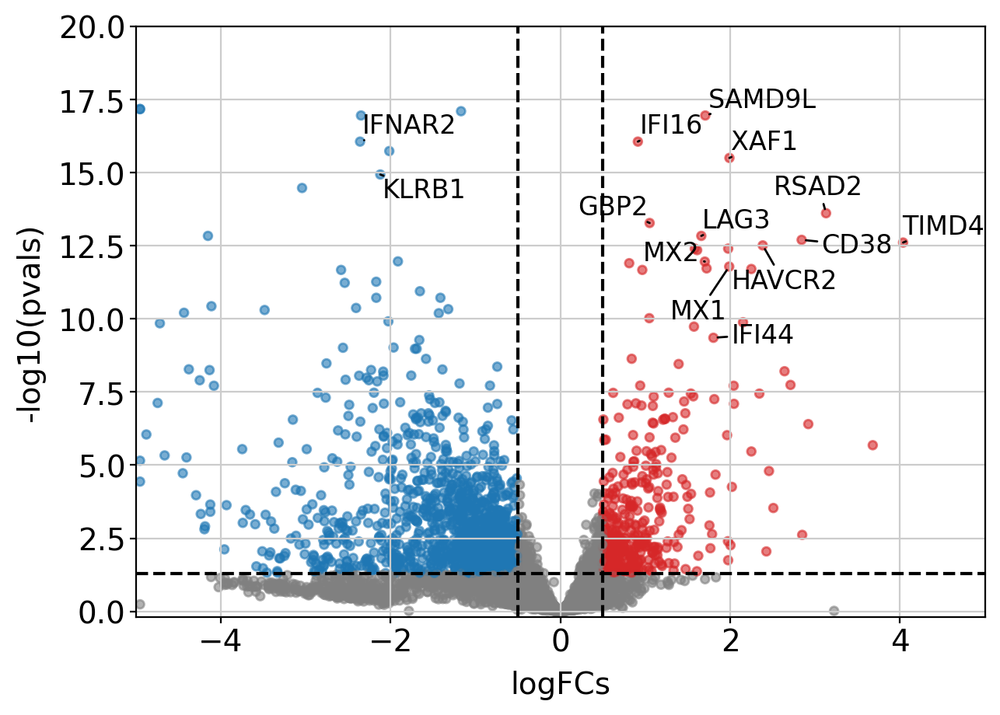

In [ ]:
results_df = stat_res.results_df
plot_volcano_selected(results_df, x='log2FoldChange', y='padj',
                      genes=['IFI16', 'LAG3', 'CD38', 'TIMD4', 'MX1', 'MX2', 'GBP2', 'HAVCR2', 'IFI44', 'IFNAR2', 'KLRB1', 'SAMD9L', 'XAF1', 'RSAD2'],
                      sign_limit=20, lFCs_limit=5)
plt.savefig('cd8_trm_covid_pseudobulk_sex.pdf')
plt.show()

# Benchmark using wrong model

In [ ]:
from scvi.data import cellxgene

local_dir = "/home/cane/Documents/yoseflab/can/scvi-hub"
adata_url = "https://cellxgene.cziscience.com/e/97a17473-e2b1-4f31-a544-44a60773e2dd.cxg/"
query_data = cellxgene(adata_url, filename="ts_epithelial.h5ad", save_path=local_dir)

In [ ]:
query_data.X = query_data.raw[:, query_data.var_names].X.toarray()

In [ ]:
import scvi
from scvi.criticism import PosteriorPredictiveCheck as PPC

In [ ]:
# add dataset information:
query_data.obs['dataset'] = query_data.obs['tissue']

In [ ]:
scvi.model.SCANVI.prepare_query_anndata(query_data, local_dir)
query_data.obs["scanvi_label"] = "unlabeled"

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               
INFO     Found 100.0% reference vars in query data.                                                                


## Build a query model

Use `prepare_query_anndata` to re-order the genes and pad any missing genes with 0s, so that query_adata matches exactly the reference in terms of its gene set.  

In [ ]:
query_model = scvi.model.SCANVI.load_query_data(query_data, local_dir, accelerator = "cpu")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [ ]:
query_model.adata

AnnData object with n_obs × n_vars = 104148 × 2000
    obs: 'tissue_in_publication', 'assay_ontology_term_id', 'donor_id', 'anatomical_information', 'n_counts_UMIs', 'n_genes', 'cell_ontology_class', 'free_annotation', 'manually_annotated', 'compartment', 'sex_ontology_term_id', 'disease_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'suspension_type', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels'
    var: 'feature_type', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_scvi', 'X_scvi_umap', 'X_umap'
    obsp: 'connectivities', 'distances'

Train the query model.

In [ ]:
surgery_epochs = 500
train_kwargs_surgery = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}

In [ ]:
query_model.train(
    max_epochs=surgery_epochs,
    accelerator="gpu",
    **train_kwargs_surgery,
)

INFO     Training for 500 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 301/500:  60%|██████    | 301/500 [20:11<13:21,  4.03s/it, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.31e+3]
Monitored metric elbo_train did not improve in the last 10 records. Best score: 1332.213. Signaling Trainer to stop.


In [ ]:
query_save_path = f"{local_dir}/query_model_ts_epithelial"
query_model.save(query_save_path, overwrite=True)

In [ ]:
query_save_path = f"{local_dir}/query_model_ts_epithelial"
query_model = scvi.model.SCANVI.load(query_save_path, adata=query_data)

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/query_model_ts_epithelial/model.pt already downloaded     


In [ ]:
query_data.obsm['X_scanvi_emb'] = query_model.get_latent_representation()

In [ ]:
import scvi.criticism as criticism
from ppc_plot_utils import PPCPlot

In [ ]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/figures_query/"

In [ ]:
# marginal_ll = []
# for i in range(query_data.n_obs):
#    marginal_ll.append(query_model.get_marginal_ll(indices=[i]))

In [ ]:
query_model.adata.obs['tissue'].unique()

['liver', 'trachea', 'parotid gland', 'anterior part of tongue', 'posterior part of tongue', ..., 'lung', 'small intestine', 'kidney', 'endocrine pancreas', 'aorta']
Length: 32
Categories (32, object): ['endocrine pancreas', 'exocrine pancreas', 'large intestine', 'aorta', ..., 'retinal neural layer', 'anterior part of tongue', 'posterior part of tongue', 'bladder organ']

In [ ]:
import copy

ScanVI Model with the following params: 
unlabeled_category: unlabeled, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

In [ ]:
ppc = {}
for tissue in query_model.adata.obs['tissue'].unique():
    print(tissue)
    q_model = copy.deepcopy(query_model)
    q_model.adata = q_model.adata[q_model.adata.obs['tissue']==tissue].copy()
    ppc[tissue] = PPC(q_model.adata, {"SCANVI": q_model}, n_samples=10)
    ppc[tissue] = criticism.PosteriorPredictiveCheck(q_model.adata, {"SCANVI": q_model})
    # expected runtime ~8min
    ppc[tissue].coefficient_of_variation("features")

    ppc_plt = PPCPlot(ppc[tissue])
    ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

    fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_{tissue}.svg'
    plt.savefig(fig_path, dpi=600, bbox_inches="tight")
    plt.title(tissue)
    plt.show()

model=SCANVI | metric=cv_cell | n_cells=1600:
Mean Absolute Error=1.78,
Pearson correlation=0.78
Spearman correlation=0.77
r^2=0.38



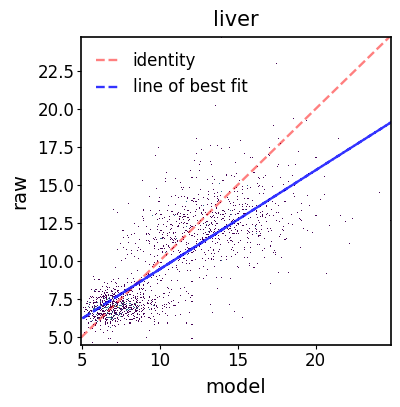

model=SCANVI | metric=cv_cell | n_cells=5047:
Mean Absolute Error=1.26,
Pearson correlation=0.78
Spearman correlation=0.80
r^2=0.61



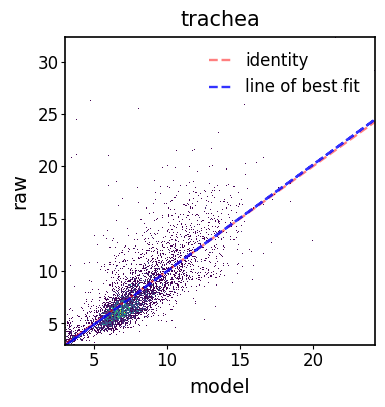

model=SCANVI | metric=cv_cell | n_cells=8932:
Mean Absolute Error=2.89,
Pearson correlation=0.30
Spearman correlation=0.14
r^2=-0.49



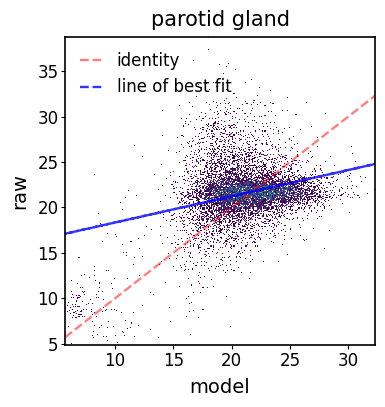

model=SCANVI | metric=cv_cell | n_cells=4498:
Mean Absolute Error=2.86,
Pearson correlation=0.18
Spearman correlation=0.15
r^2=-0.86



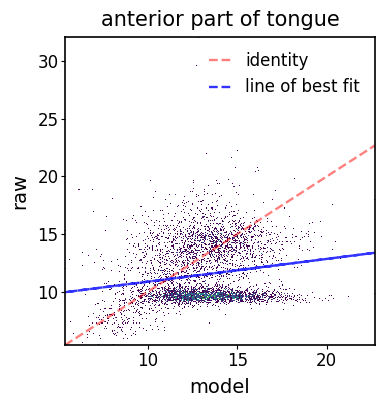

model=SCANVI | metric=cv_cell | n_cells=7395:
Mean Absolute Error=1.84,
Pearson correlation=0.71
Spearman correlation=0.74
r^2=0.36



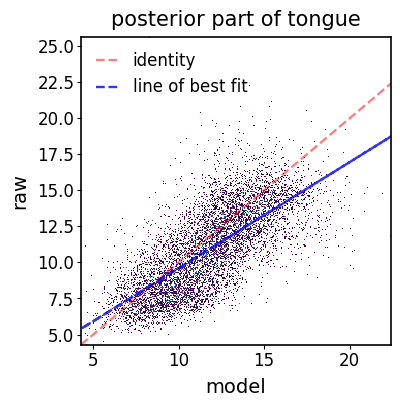

model=SCANVI | metric=cv_cell | n_cells=5854:
Mean Absolute Error=3.13,
Pearson correlation=0.40
Spearman correlation=0.47
r^2=-0.50



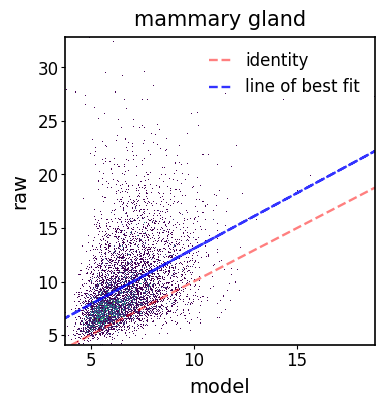

model=SCANVI | metric=cv_cell | n_cells=230:
Mean Absolute Error=1.09,
Pearson correlation=0.25
Spearman correlation=0.37
r^2=-0.50



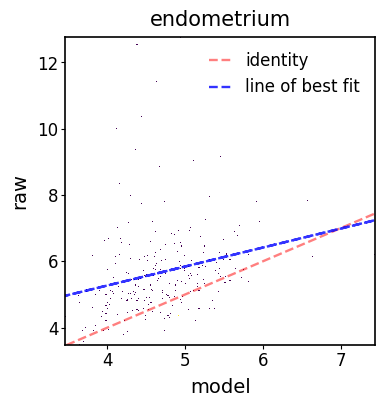

model=SCANVI | metric=cv_cell | n_cells=9:
Mean Absolute Error=2.05,
Pearson correlation=-0.36
Spearman correlation=-0.40
r^2=-0.53



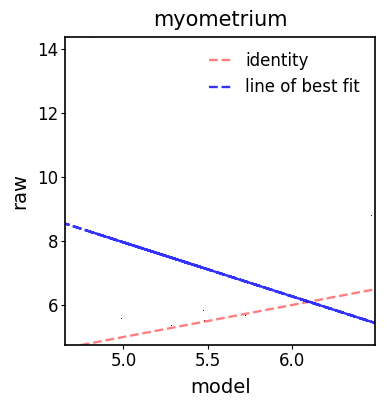

model=SCANVI | metric=cv_cell | n_cells=2052:
Mean Absolute Error=2.32,
Pearson correlation=0.22
Spearman correlation=0.16
r^2=-0.89



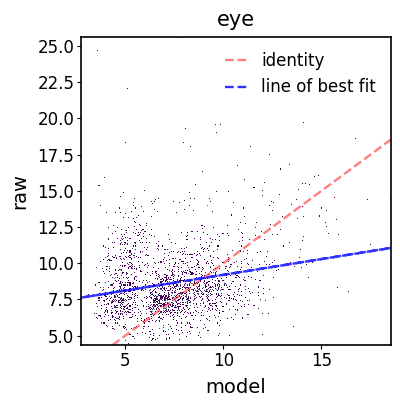

model=SCANVI | metric=cv_cell | n_cells=2084:
Mean Absolute Error=0.61,
Pearson correlation=0.33
Spearman correlation=0.35
r^2=-0.10



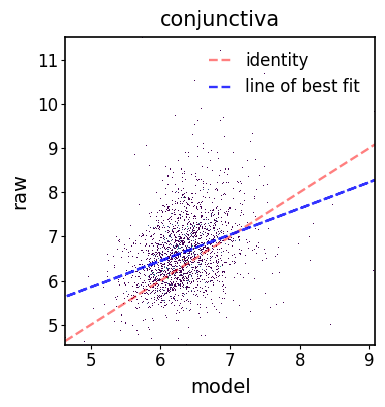

model=SCANVI | metric=cv_cell | n_cells=59:
Mean Absolute Error=4.72,
Pearson correlation=0.03
Spearman correlation=0.09
r^2=-1.32



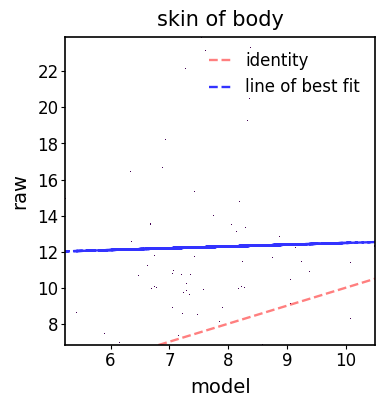

model=SCANVI | metric=cv_cell | n_cells=787:
Mean Absolute Error=3.65,
Pearson correlation=0.23
Spearman correlation=0.19
r^2=-0.94



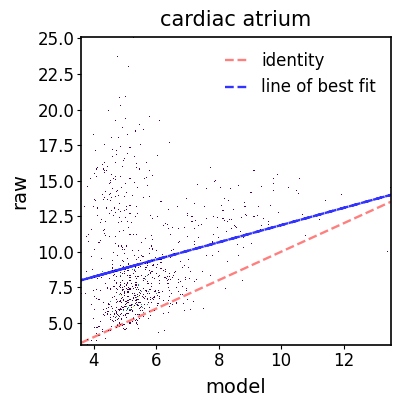

model=SCANVI | metric=cv_cell | n_cells=302:
Mean Absolute Error=3.81,
Pearson correlation=-0.03
Spearman correlation=-0.01
r^2=-1.20



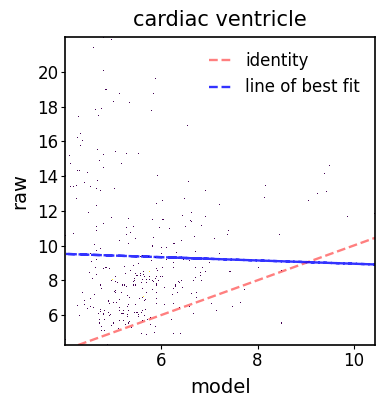

model=SCANVI | metric=cv_cell | n_cells=7128:
Mean Absolute Error=7.62,
Pearson correlation=0.61
Spearman correlation=0.67
r^2=-0.75



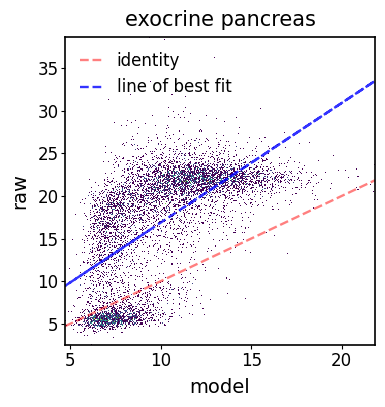

model=SCANVI | metric=cv_cell | n_cells=12316:
Mean Absolute Error=3.56,
Pearson correlation=0.39
Spearman correlation=0.40
r^2=-0.45



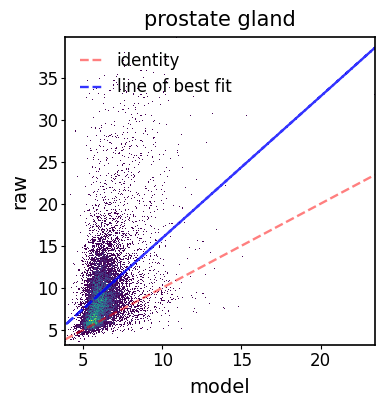

model=SCANVI | metric=cv_cell | n_cells=9:
Mean Absolute Error=3.80,
Pearson correlation=0.35
Spearman correlation=0.08
r^2=-2.78



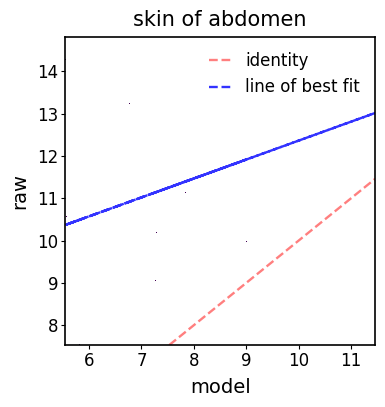

model=SCANVI | metric=cv_cell | n_cells=38:
Mean Absolute Error=6.73,
Pearson correlation=0.04
Spearman correlation=0.06
r^2=-1.93



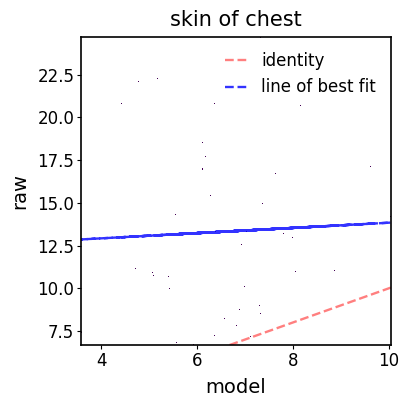

model=SCANVI | metric=cv_cell | n_cells=5:
Mean Absolute Error=12.79,
Pearson correlation=-0.63
Spearman correlation=-0.50
r^2=-12.44



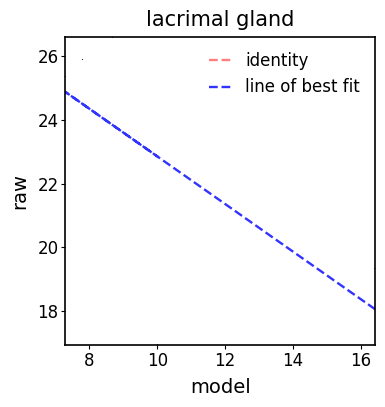

model=SCANVI | metric=cv_cell | n_cells=54:
Mean Absolute Error=3.42,
Pearson correlation=0.41
Spearman correlation=0.36
r^2=-0.70



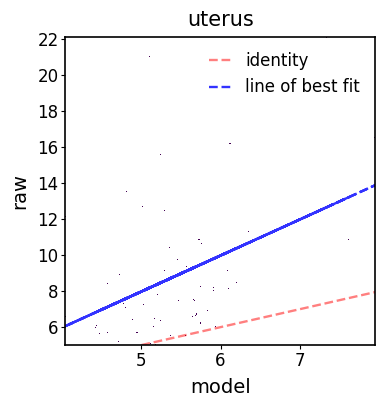

model=SCANVI | metric=cv_cell | n_cells=169:
Mean Absolute Error=5.25,
Pearson correlation=0.17
Spearman correlation=0.24
r^2=-0.85



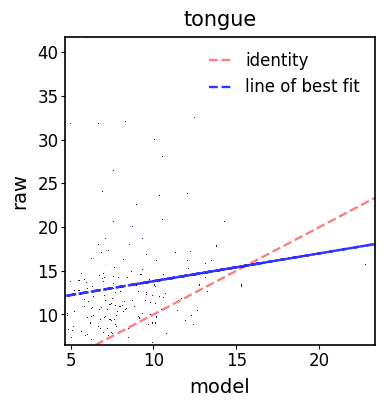

model=SCANVI | metric=cv_cell | n_cells=4158:
Mean Absolute Error=1.83,
Pearson correlation=0.64
Spearman correlation=0.73
r^2=0.30



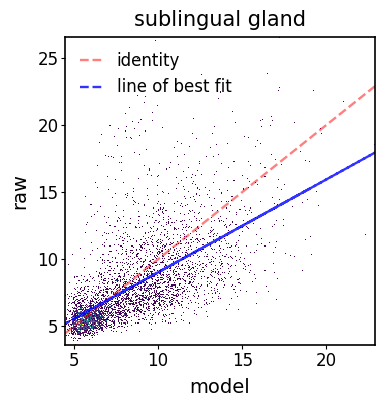

model=SCANVI | metric=cv_cell | n_cells=178:
Mean Absolute Error=2.78,
Pearson correlation=0.08
Spearman correlation=0.15
r^2=-1.00



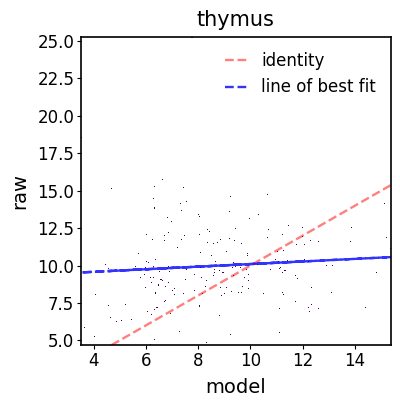

model=SCANVI | metric=cv_cell | n_cells=2940:
Mean Absolute Error=1.88,
Pearson correlation=0.17
Spearman correlation=0.09
r^2=-0.48



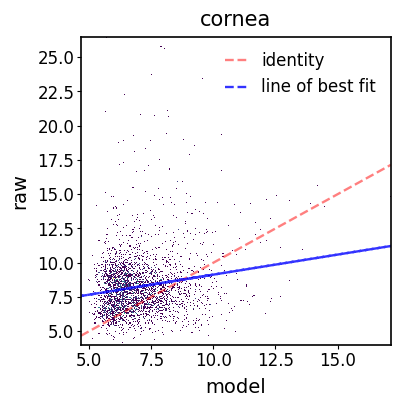

model=SCANVI | metric=cv_cell | n_cells=325:
Mean Absolute Error=3.02,
Pearson correlation=0.23
Spearman correlation=0.25
r^2=-3.67



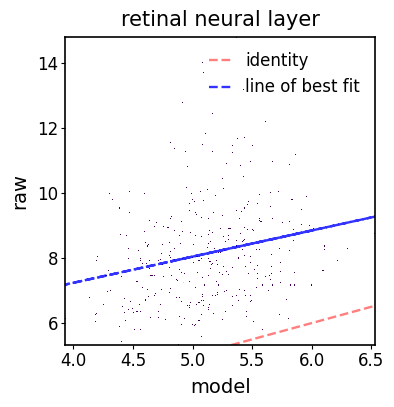

model=SCANVI | metric=cv_cell | n_cells=471:
Mean Absolute Error=1.59,
Pearson correlation=0.26
Spearman correlation=0.28
r^2=-0.09



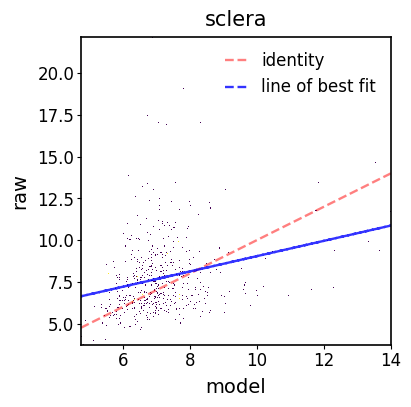

model=SCANVI | metric=cv_cell | n_cells=4151:
Mean Absolute Error=1.30,
Pearson correlation=0.22
Spearman correlation=0.28
r^2=-0.49



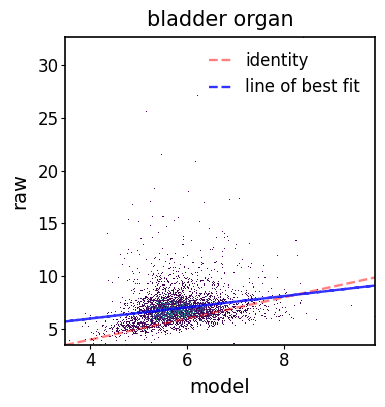

model=SCANVI | metric=cv_cell | n_cells=6220:
Mean Absolute Error=1.94,
Pearson correlation=-0.08
Spearman correlation=0.05
r^2=-0.53



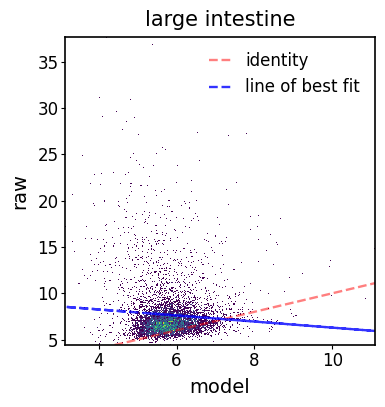

model=SCANVI | metric=cv_cell | n_cells=13981:
Mean Absolute Error=2.24,
Pearson correlation=0.91
Spearman correlation=0.91
r^2=0.82



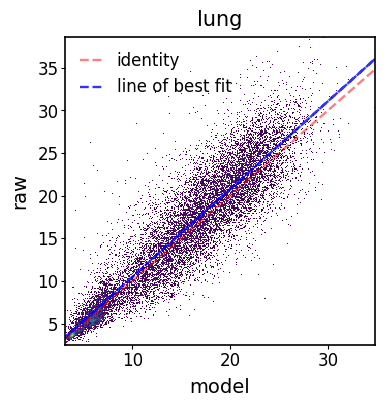

model=SCANVI | metric=cv_cell | n_cells=3712:
Mean Absolute Error=2.92,
Pearson correlation=0.26
Spearman correlation=0.27
r^2=-0.45



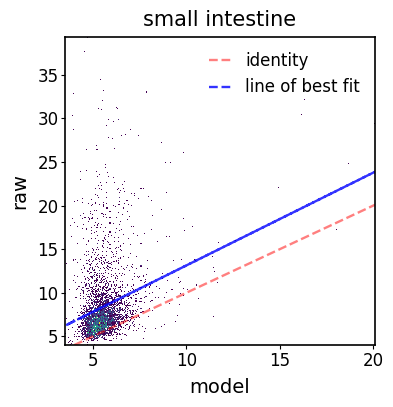

model=SCANVI | metric=cv_cell | n_cells=8331:
Mean Absolute Error=5.21,
Pearson correlation=0.01
Spearman correlation=-0.01
r^2=-2.43



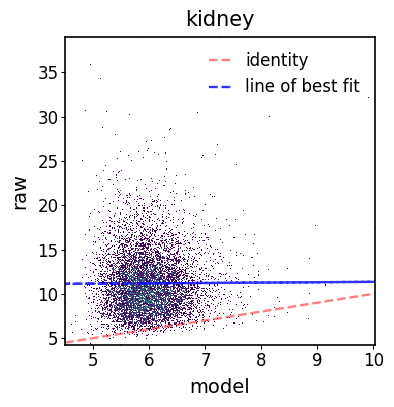

model=SCANVI | metric=cv_cell | n_cells=1087:
Mean Absolute Error=6.81,
Pearson correlation=0.39
Spearman correlation=0.35
r^2=-0.43



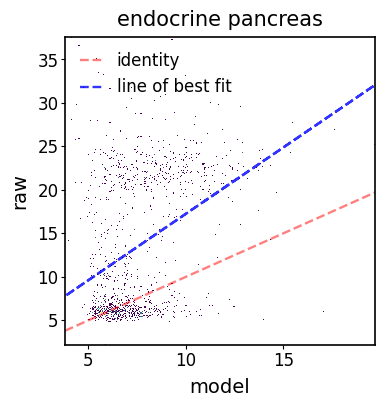

model=SCANVI | metric=cv_cell | n_cells=26:
Mean Absolute Error=2.70,
Pearson correlation=0.07
Spearman correlation=0.08
r^2=-0.66



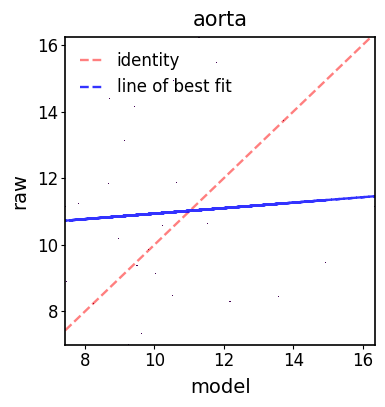

In [ ]:
for tissue in query_model.adata.obs['tissue'].unique():
    ppc_plt = PPCPlot(ppc[tissue])
    ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

    fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_{tissue}.svg'
    plt.savefig(fig_path, dpi=600, bbox_inches="tight")
    plt.title(tissue)
    plt.show()

model=SCANVI | metric=cv_cell | n_cells=90167:
Mean Absolute Error=3.15,
Pearson correlation=0.69
Spearman correlation=0.59
r^2=0.31



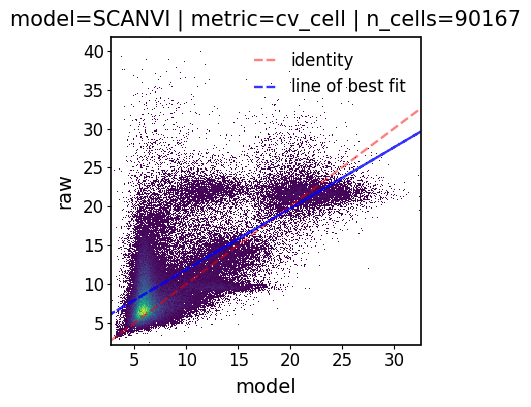

In [ ]:
ppc_nolung = criticism.PosteriorPredictiveCheck(query_model.adata[query_model.adata.obs['tissue']!='lung'], models_dict)
# expected runtime ~8min
ppc_nolung.coefficient_of_variation("features")

ppc_plt = PPCPlot(ppc_nolung)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_no_lung.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

In [ ]:
query_model2 = query_model
query_model2.adata = query_data[query_data.obs['tissue']=='lung']

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


model=SCANVI | metric=cv_cell | n_cells=13981:
Mean Absolute Error=2.23,
Pearson correlation=0.91
Spearman correlation=0.91
r^2=0.83



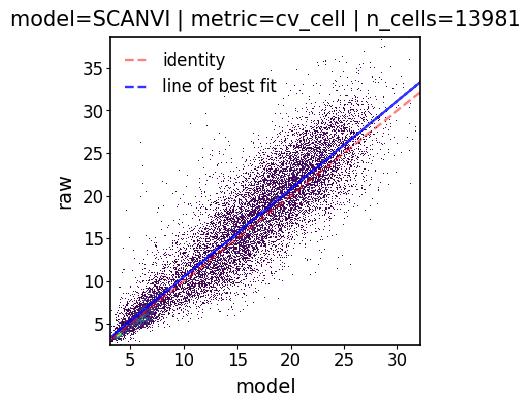

In [ ]:
ppc_lung = criticism.PosteriorPredictiveCheck(query_model2.adata[query_model2.adata.obs['tissue']=='lung'], models_dict)
# expected runtime ~8min
ppc_lung.coefficient_of_variation("features")

ppc_plt_lung = PPCPlot(ppc_lung)
ppc_plt_lung.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_cell_ts_query_lung.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


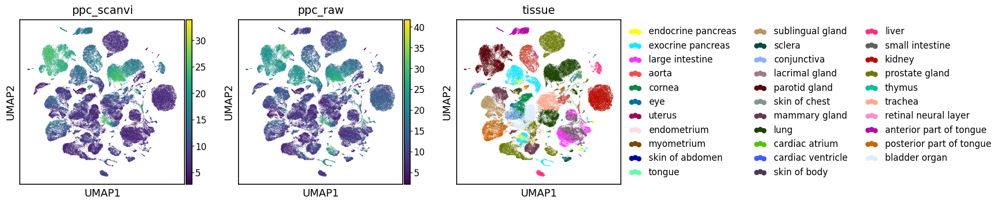

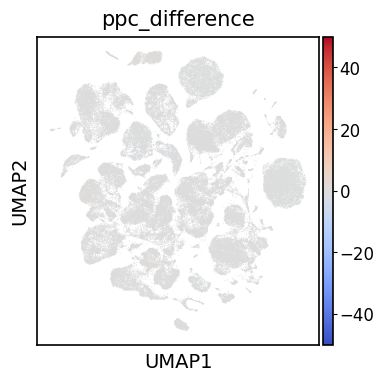

In [ ]:
query_data.obs['ppc_scanvi'] = ppc.metrics['cv_cell']['SCANVI']
query_data.obs['ppc_raw'] = ppc.metrics['cv_cell']['Raw']
query_data.obs['ppc_difference'] = (query_data.obs['ppc_scanvi'] - query_data.obs['ppc_raw']) / query_data.obs['ppc_raw']
sc.pl.umap(query_data, color=['ppc_scanvi', 'ppc_raw', 'tissue'])
sc.pl.umap(query_data, color=['ppc_difference'], color_map='coolwarm', vmax=50, vmin=-50)

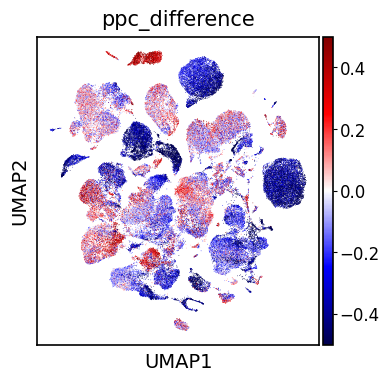

In [ ]:
sc.pl.umap(query_data, color=['ppc_difference'], color_map='seismic', vmax=0.5, vmin=-0.5, sort_order=False)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


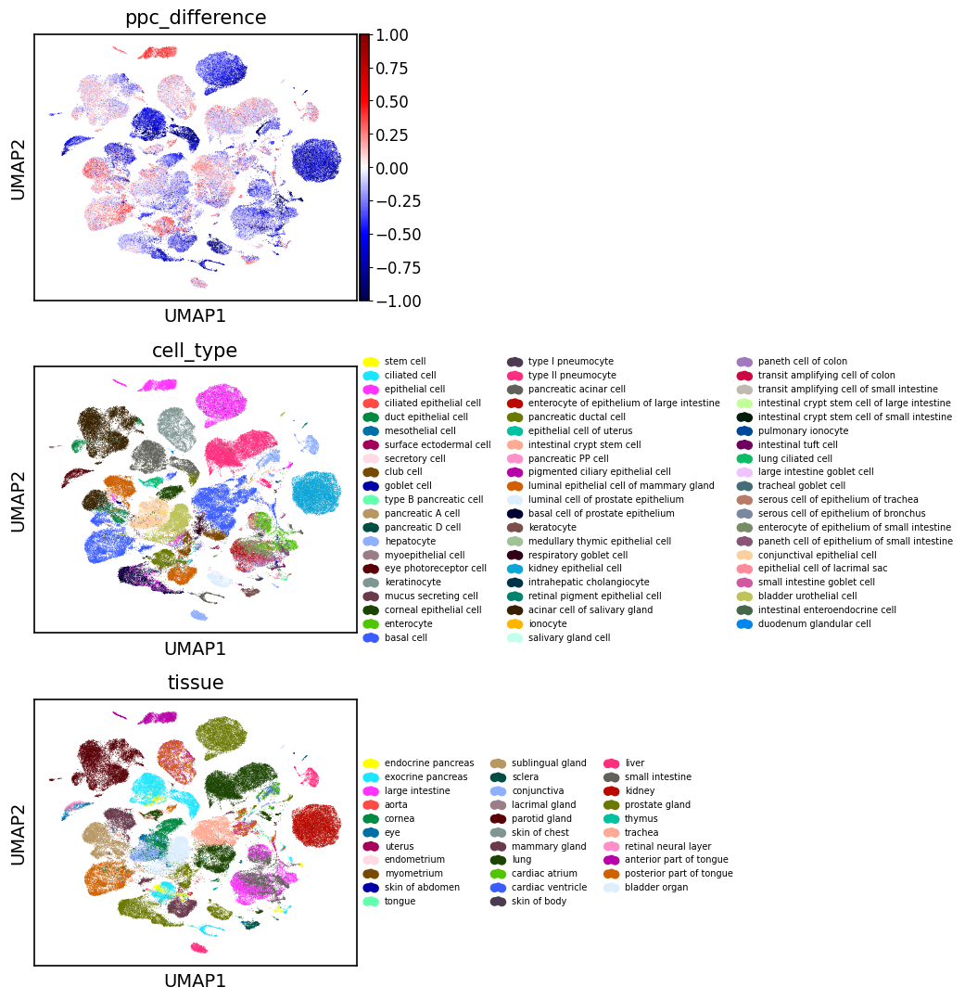

In [ ]:
query_data.obs['ppc_difference'] = np.log(query_data.obs['ppc_scanvi'] / query_data.obs['ppc_raw'])
sc.pl.umap(query_data, color=['ppc_difference', 'cell_type', 'tissue'], color_map='seismic', vmax=1.0, vmin=-1.0, ncols=1, legend_fontsize=7, sort_order=False, save='ppc_cells_ts_epithelial.svg')